In [1]:
import scanpy as sc

import muon as mu

from muon import atac as ac
from muon import prot as pt

import scipy
import numpy as np 
import pandas as pd
 
from matplotlib import pyplot as plt
import seaborn as sns

import pandas as pd

2024-12-18 10:45:53.528551: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-18 10:45:56.896111: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def write_dataset(data, path, sep='\t', header=True, index=True, compression=None):
    """
    See pandas.to_csv documentation - this is just a wrapper
    :param data: data to save
    :param path: str or Path object, path to save
    :param sep:
    :param header:
    :param index:
    :param compression:
    :return:
    """
    from pathlib import Path

    if isinstance(path, str):
        path = Path(path)

    output_dir = path.parents[0]
    output_dir.mkdir(parents=True, exist_ok=True)

    return data.to_csv(
        path, sep=sep, header=header, index=index, compression=compression
    )

In [3]:
sc.__version__

'1.10.1'

In [4]:
def axis_net(x, y, title='', x_len=4, y_len=4, title_y=1, gridspec_kw=None):
    """
    Return an axis iterative for subplots arranged in a net
    :param x: int, number of subplots in a row
    :param y: int, number of subplots in a column
    :param title: str, plot title
    :param x_len: float, width of a subplot in inches
    :param y_len: float, height of a subplot in inches
    :param gridspec_kw: is used to specify axis ner with different rows/cols sizes.
            A dict: height_ratios -> list + width_ratios -> list
    :param title_y: absolute y position for suptitle
    :return: axs.flat, numpy.flatiter object which consists of axes (for further plots)
    """
    if x == y == 1:
        fig, ax = plt.subplots(figsize=(x * x_len, y * y_len))
        af = ax
    else:
        fig, axs = plt.subplots(
            y, x, figsize=(x * x_len, y * y_len), gridspec_kw=gridspec_kw
        )
        af = axs.flat

    fig.suptitle(title, y=title_y)
    return af



#sc.pl.umap(adata_aggregated, color=['sample','phase' ], color_map='Blues', )

In [5]:
def bot_bar_plot(
    data,
    palette=None,
    lrot=0,
    figsize=(5, 5),
    title='',
    ax=None,
    order=None,
    stars=False,
    percent=False,
    pvalue=False,
    p_digits=5,
    legend=True,
    xl=True,
    offset=-0.1,
    linewidth=0,
    align='center',
    bar_width=0.9,
    edgecolor=None,
    hide_grid=True,
    draw_horizontal=False,
    plot_all_borders=True,
    **kwargs
):
    """
    Plot a stacked bar plot based on contingency table

    Parameters
    ----------
    data: pd.DataFrame
        contingency table for plotting. Each element of index corresponds to a bar.
    palette: dict
        palette for plotting. Keys are unique values from groups, entries are color hexes
    lrot: float
        rotation angle of bar labels in degrees
    figsize: (float, float)
        figure size in inches
    title: str
        plot title
    ax: matplotlib axis
        axis to plot on
    order: list
        what order to plot the stacks of each bar in. Contains column labels of "data"
    stars: bool
        whether to use the star notation for p value instead of numerical value
    percent: bool
        whether to normalize each bar to 1
    pvalue: bool
        whether to add the p value (chi2 contingency test) to the plot title.
    p_digits: int
        number of digits to round the p value to
    legend: bool
        whether to plot the legend
    xl: bool
        whether to plot bar labels (on x axis for horizontal plot, on y axis for vertical plot)
    hide_grid: bool
        whether to hide grid on plot
    draw_horizontal: bool
        whether to draw horizontal bot bar plot
    plot_all_borders: bool
        whether to plot top and right border

    Returns
    -------
    matplotlib axis
    """
    from matplotlib.ticker import FuncFormatter

    if ax is None:
        _, ax = plt.subplots(figsize=figsize)

    if pvalue:
        from scipy.stats import chi2_contingency

        chi2_test_data = chi2_contingency(data)
        p = chi2_test_data[1]
        if title is not False:
            title += '\n' + get_pvalue_string(p, p_digits, stars=stars)

    if percent:
        c_data = data.apply(lambda x: x * 1.0 / x.sum(), axis=1)
        if title:
            title = '% ' + title
        ax.set_ylim(0, 1)
    else:
        c_data = data

    c_data.columns = [str(x) for x in c_data.columns]

    if order is None:
        order = c_data.columns
    else:
        order = [str(x) for x in order]

    if palette is None:
        c_palette = lin_colors(pd.Series(order))

        if len(order) == 1:
            c_palette = {order[0]: blue_color}
    # else:
    #     c_palette = {str(k): v for k, v in palette.items()}

    if edgecolor is not None:
        edgecolor = [edgecolor] * len(c_data)

    kind_type = 'bar'
    if draw_horizontal:
        kind_type = 'barh'

    c_data[order].plot(
        kind=kind_type,
        stacked=True,
        position=offset,
        width=bar_width,
        color=palette,
        ax=ax,
        linewidth=linewidth,
        align=align,
        edgecolor=edgecolor,
    )

    ax = bot_bar_plot_prettify_axis(
        ax,
        c_data,
        legend,
        draw_horizontal,
        xl,
        lrot,
        title,
        hide_grid,
        plot_all_borders,
        **kwargs
    )

    if percent:
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))

    return ax

def bot_bar_plot_prettify_axis(ax, c_data, legend, draw_horizontal, xl, lrot, title, hide_grid, plot_all_borders,
                               **kwargs):
    """
    Change some properties of bot_bar_plot ax

    Returns
    -------
    prettified axis
    """

    if legend:
        ax.legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=0.1)
    else:
        ax.legend_.remove()

    if 'ylabel' in kwargs.keys():
        ax.set(ylabel=kwargs['ylabel'])

    if 'xlabel' in kwargs.keys():
        ax.set(xlabel=kwargs['xlabel'])

    if not draw_horizontal:
        ax.set_xticks(np.arange(len(c_data.index)) + 0.5)
        if xl:
            ax.set_xticklabels(c_data.index, rotation=lrot)
        else:
            ax.set_xticklabels([])
    else:
        ax.set_yticks(np.arange(len(c_data.index)) + 0.5)
        if xl:
            ax.set_yticklabels(c_data.index, rotation=lrot)
        else:
            ax.set_yticklabels([])

    if title is not False:
        ax.set_title(title)

    if hide_grid:
        ax.grid(False)

    sns.despine(ax=ax)

    if plot_all_borders:
        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)

    return ax
def pivot_vectors(vec1, vec2, na_label_1=None, na_label_2=None):
    """
    Aggregates 2 vectors into a table with amount of pairs (vec1.x, vec2.y) in a cell
    Both series must have same index.
    Else different indexes values will be counted in a_label_1/na_label_2 columns if specified or ignored
    :param vec1: pd.Series
    :param vec2: pd.Series
    :param na_label_1: How to name NA column
    :param na_label_2: How to name NA row
    :return: pivot table
    """

    name1 = str(vec1.name)
    if vec1.name is None:
        name1 = 'V1'

    name2 = str(vec2.name)
    if vec2.name is None:
        name2 = 'V2'

    if name1 == name2:
        name1 += '_1'
        name2 += '_2'

    sub_df = pd.DataFrame({name1: vec1, name2: vec2})
    # FillNAs
    fill_dict = {}
    if na_label_1 is not None:
        fill_dict[name1] = na_label_1
    if na_label_2 is not None:
        fill_dict[name2] = na_label_2
    sub_df.fillna(value=fill_dict, inplace=True)

    sub_df = sub_df.assign(N=item_series(1, sub_df))

    return (
        pd.pivot_table(data=sub_df, columns=name1, index=name2, values='N', aggfunc=sum)
        .fillna(0)
        .astype(int)
    )
def item_series(item, indexed=None):
    """
    Creates a series filled with item with indexes from indexed (if Series-like) or numerical indexes (size=indexed)
    :param item: value for filling
    :param indexed:
    :return:
    """
    if indexed is not None:
        if hasattr(indexed, 'index'):
            return pd.Series([item] * len(indexed), index=indexed.index)
        elif type(indexed) is int and indexed > 0:
            return pd.Series([item] * indexed, index=np.arange(indexed))
    return pd.Series()

def lin_colors(
    factors_vector,
    cmap='default',
    sort=True,
    min_v=0,
    max_v=1,
    linspace=True,
    lighten_color=None,
):
    """
    Return dictionary of unique features of "factors_vector" as keys and color hexes as entries
    :param factors_vector: pd.Series
    :param cmap: matplotlib.colors.LinearSegmentedColormap, which colormap to base the returned dictionary on
        default - matplotlib.cmap.hsv with min_v=0, max_v=.8, lighten_color=.9
    :param sort: bool, whether to sort the unique features
    :param min_v: float, for continuous palette - minimum number to choose colors from
    :param max_v: float, for continuous palette - maximum number to choose colors from
    :param linspace: bool, whether to spread the colors from "min_v" to "max_v"
        linspace=False can be used only in discrete cmaps
    :param lighten_color: float, from 0 to +inf: 0 - very dark (just black), 1 - original color, >1 - brighter color
    :return: dict
    """

    unique_factors = factors_vector.dropna().unique()
    if sort:
        unique_factors = np.sort(unique_factors)

    if cmap == 'default':
        cmap = plt.cm.rainbow
        max_v = 0.92

    if linspace:
        cmap_colors = cmap(np.linspace(min_v, max_v, len(unique_factors)))
    else:
        cmap_colors = np.array(cmap.colors[: len(unique_factors)])

    if lighten_color is not None:
        cmap_colors = [x * lighten_color for x in cmap_colors]
        cmap_colors = np.array(cmap_colors).clip(0, 1)

    return dict(
        list(zip(unique_factors, [plt.colors.to_hex(x) for x in cmap_colors]))
    )
def round_to_1(x):
    """
    Round "x" to first significant digit
    :param x: float
    :return: float
    """
    from math import floor, log10

    return round(x, -int(floor(log10(abs(x)))))

def star_pvalue(pvalue, lev1=0.05, lev2=0.01, lev3=0.001):
    """
    Return star notation for p value
    :param pvalue: float
    :param lev1: float, '*' threshold
    :param lev2: float, '**' threshold
    :param lev3: float, '***' threshold
    :return: str
    """
    if pvalue < lev3:
        return '***'
    if pvalue < lev2:
        return '**'
    if pvalue < lev1:
        return '*'
    return '-'


def to_common_samples(df_list=()):
    """
    Accepts a list of dataframe/series-s. Returns all dataframe/series-s with intersected indexes in the same order
    :param df_list: list of pd.DataFrame/pd.Series
    :return: pd.DataFrame
    """
    cs = set(df_list[0].index)
    for i in range(1, len(df_list)):
        cs = cs.intersection(df_list[i].index)

    if len(cs) < 1:
        warnings.warn('No common samples!')
    return [df_list[i].loc[list(cs)] for i in range(len(df_list))]

def get_pvalue_string(p, p_digits=3, stars=False, prefix='p-value'):
    """
    Return string with p-value, rounded to p_digits
    :param stars: Display pvalue as stars
    :param p: float, p-value
    :param p_digits: int, default 4, number of digits to round p-value
    :param prefix:
    :return: str, p-value info string
    """
    significant_pvalue = 10**-p_digits
    if stars:
        pvalue_str = star_pvalue(p, lev3=10**-p_digits)
    else:
        if p < significant_pvalue:
            if len(prefix):
                prefix += ' < '
            pvalue_str = f'{prefix}{significant_pvalue}'
        else:
            if len(prefix):
                prefix += ' = '
            if p < 0.00001:
                pvalue_str = f'{prefix}{round_to_1(p):.0e}'
            else:
                pvalue_str = f'{prefix}{round_to_1(p)}'
    return pvalue_str

def boxplot_with_pvalue(
    data,
    grouping,
    title='',
    ax=None,
    figsize=None,
    swarm=True,
    p_digits=3,
    stars=True,
    violin=False,
    palette=None,
    order=None,
    y_min=None,
    y_max=None,
    s=7,
    p_fontsize=16,
    xlabel=None,
    **kwargs,
):
    """
    Plots boxplot or violin plot with pairwise comparisons
    :param data: pd.Series, series with numerical data
    :param grouping: pd.Series, series with categorical data
    :param title: str, plot title
    :param ax: matplotlib axis, axis to plot on
    :param figsize: (float, float), figure size in inches
    :param swarm: bool, whether to plot a swarm in addition to boxes
    :param p_digits: int, number of digits to round p value to
    :param stars: bool, whether to plot star notation instead of number for p value
    :param violin: bool, whether to do a violin plot
    :param palette: dict, palette for plotting. Keys are unique values from groups, entries are color hexes
    :param order: list, order to plot the entries in. Contains ordered unique values from "grouping"
    :param y_min: float, vertical axis minimum
    :param y_max:float, vertical axis maximum
    :param s: float, size of dots in swarmplot
    :param p_fontsize: float, font size for p value labels
    :param kwargs:
    :return: matplotlib axis
    """

    from scipy.stats import mannwhitneyu

    if data.index.duplicated().any() | grouping.index.duplicated().any():
        raise Exception('Indexes contain duplicates')

    cdata, cgrouping = to_common_samples([data.dropna(), grouping.dropna()])

    if len(cgrouping.dropna().unique()) < 2:
        raise Exception(
            'Less from 2 classes provided: {}'.format(len(cgrouping.unique()))
        )

    if order is None:
        order = cgrouping.dropna().unique()

    if ax is None:
        if figsize is None:
            figsize = (1.2 * len(order), 4)
        _, ax = plt.subplots(figsize=figsize)

    if not violin:
        sns.boxplot(
            y=cdata,
            x=cgrouping,
            ax=ax,
            palette=palette,
            order=order,
            fliersize=0,
            **kwargs,
        )
    else:
        sns.violinplot(
            y=cdata, x=cgrouping, ax=ax, palette=palette, order=order, **kwargs
        )

        # Ignoring swarm setting since violin performs same function
        swarm = False

    if swarm:
        sns.swarmplot(y=cdata, x=cgrouping, ax=ax, color=".25", order=order, s=s)

    pvalues = []
    for g1, g2 in zip(order[:-1], order[1:]):
        samples_g1 = cgrouping[cgrouping == g1].index
        samples_g2 = cgrouping[cgrouping == g2].index
        try:
            if len(samples_g1) and len(samples_g2):
                pv = mannwhitneyu(
                    cdata.loc[samples_g1],
                    cdata.loc[samples_g2],
                    alternative='two-sided',
                ).pvalue
            else:
                pv = 1
        except ValueError:
            pv = 1
        pvalues.append(pv)

    y_max = y_max or max(cdata)
    y_min = y_min or min(cdata)
    effective_size = y_max - y_min
    plot_y_limits = (y_min - effective_size * 0.15, y_max + effective_size * 0.2)

    if p_digits > 0:

        pvalue_line_y_1 = y_max + effective_size * 0.05
        if figsize is None:
            figsize = define_ax_figsize(ax)
        pvalue_text_y_1 = pvalue_line_y_1 + 0.25 * effective_size / figsize[1]

        for pos, pv in enumerate(pvalues):
            pvalue_str = get_pvalue_string(pv, p_digits, stars=stars)
            pvalue_text_y_1_local = pvalue_text_y_1

            if pvalue_str == '-':
                pvalue_text_y_1_local += 0.1 * effective_size / figsize[1]

            bar_fraction = str(0.25 / 2.0 / (figsize[0] / float(len(order))))

            ax.annotate(
                "",
                xy=(pos + 0.1, pvalue_line_y_1),
                xycoords='data',
                xytext=(pos + 0.9, pvalue_line_y_1),
                textcoords='data',
                arrowprops=dict(
                    arrowstyle="-",
                    ec='#000000',
                    connectionstyle="bar,fraction={}".format(bar_fraction),
                ),
            )
            ax.text(
                pos + 0.5,
                pvalue_text_y_1_local,
                pvalue_str,
                fontsize=p_fontsize,
                horizontalalignment='center',
                verticalalignment='center',
            )

    ax.set_title(title)
    ax.set_ylim(plot_y_limits)

    if xlabel is not None:
        ax.set_xlabel(xlabel)

    return ax


In [6]:
!pwd

/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal


In [7]:
# Define the base directory
BASE_DIR = '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

In [8]:
SEED = 42
import numpy as np
import random
import tensorflow as tf

np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

## BTROHT_01

In [179]:
mdata_perimarginal = mu.read_10x_h5("/group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT01/BTROHT01/BTROHT01_T1_T7_T9/multiome/LAZ_160/filtered_feature_bc_matrix.h5")
mdata_perimarginal

Added `interval` annotation for features from /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT01/BTROHT01/BTROHT01_T1_T7_T9/multiome/LAZ_160/filtered_feature_bc_matrix.h5
Added peak annotation from /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT01/BTROHT01/BTROHT01_T1_T7_T9/multiome/LAZ_160/atac_peak_annotation.tsv to .uns['atac']['peak_annotation']
Added gene names to peak annotation in .uns['atac']['peak_annotation']
Located fragments file: /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT01/BTROHT01/BTROHT01_T1_T7_T9/multiome/LAZ_160/atac_fragments.tsv.gz


MuData object with n_obs × n_vars = 4563 × 150301
  var:	'gene_ids', 'feature_types', 'genome', 'interval'
  2 modalities
    rna:	4563 x 36601
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
    atac:	4563 x 113700
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
      uns:	'atac', 'files'

In [180]:
mdata_perimarginal

MuData object with n_obs × n_vars = 4563 × 150301
  var:	'gene_ids', 'feature_types', 'genome', 'interval'
  2 modalities
    rna:	4563 x 36601
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
    atac:	4563 x 113700
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
      uns:	'atac', 'files'

In [181]:
mdata_perimarginal.var

,gene_ids,feature_types,genome,interval
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,chr1:29553-30267
FAM138A,ENSG00000237613,Gene Expression,GRCh38,chr1:36080-36081
OR4F5,ENSG00000186092,Gene Expression,GRCh38,chr1:65418-69055
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,chr1:120931-133723
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,chr1:91104-91105
...,...,...,...,...
KI270711.1:27201-27988,KI270711.1:27201-27988,Peaks,GRCh38,KI270711.1:27201-27988
KI270713.1:15902-16461,KI270713.1:15902-16461,Peaks,GRCh38,KI270713.1:15902-16461
KI270713.1:21449-22355,KI270713.1:21449-22355,Peaks,GRCh38,KI270713.1:21449-22355
KI270713.1:25979-26706,KI270713.1:25979-26706,Peaks,GRCh38,KI270713.1:25979-26706


In [182]:
mdata_perimarginal.var_names_make_unique()
rna_perimarginal = mdata_perimarginal.mod['rna']
rna_perimarginal

AnnData object with n_obs × n_vars = 4563 × 36601
    var: 'gene_ids', 'feature_types', 'genome', 'interval'

In [183]:
atac = mdata_perimarginal.mod['atac'] 
atac

AnnData object with n_obs × n_vars = 4563 × 113700
    var: 'gene_ids', 'feature_types', 'genome', 'interval'
    uns: 'atac', 'files'

In [74]:
## Save Raw ATAC abd Raw mdata

In [75]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

## Save Raw ATAC and Raw mdata

In [76]:
# Save the file
mdata_perimarginal.write(f'{BASE_DIR}/BTROHT01_1_peri_mdata_rna_atac.h5ad')

In [77]:
# Save the file
rna_perimarginal.write(f'{BASE_DIR}/BTROHT01_2_peri_raw_rna.h5ad')

In [184]:
atac.write(f'{BASE_DIR}/BTROHT01_3_peri_raw_atac.h5ad')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


## Reading the RNA-data

In [79]:
rna_perimarginal = sc.read(f'{BASE_DIR}/BTROHT01_2_peri_raw_rna.h5ad')

In [80]:
atac = sc.read(f'{BASE_DIR}/BTROHT01_3_peri_raw_atac.h5ad')

## Opening the Count Matrics

In [84]:
rna_perimarginal.X

<4563x36601 sparse matrix of type '<class 'numpy.float32'>'
	with 9321513 stored elements in Compressed Sparse Row format>

In [85]:
dense_matrix = rna_perimarginal.X.toarray()  # Convert to a dense NumPy array
print(dense_matrix)  # Display the entire matrix

print(dense_matrix[:45, :500])  # View the first 45 rows and 500 columns

import pandas as pd

# Create a DataFrame with genes as columns and cells as rows
matrix_df = pd.DataFrame(
    dense_matrix, 
    index=rna_perimarginal.obs_names,  # Cell IDs
    columns=rna_perimarginal.var_names  # Gene names
)

# View the DataFrame
print(matrix_df)

# Display the column for the gene FAM138A
print(matrix_df["FAM138A"])


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
                    MIR1302-2HG  FAM138A  OR4F5  AL627309.1  AL627309.3  \
AAACAGCCAATGCCCG-1          0.0      0.0    0.0         0.0         0.0   
AAACAGCCAGGTCCTG-1          0.0      0.0    0.0         0.0         0.0   
AAACAGCCATAAGCAA-1          0.0      0.0    0.0         0.0         0.0   
AAACAGCCATAAGGAC-1          0.0      0.0    0.0         0.0         0.0   
AAACATGCAGAACCGA-1          0.0      0.0    0.0         0.0         0.0   
...                         ...      ...    ...         ...         ...   
TTTGTTGGTAACGGGA-1          0.0      0.0    0.0         0.0         0.0   
TTTGTTGGTACCGTTT-1          0.0      0.0    0.0         0.0         0.0   
TTTGTTGGTTAAC

In [86]:
print(rna_perimarginal.X)
rna_perimarginal.X.shape

  (0, 44)	1.0
  (0, 51)	3.0
  (0, 53)	1.0
  (0, 60)	2.0
  (0, 71)	1.0
  (0, 83)	1.0
  (0, 86)	16.0
  (0, 90)	2.0
  (0, 92)	1.0
  (0, 94)	14.0
  (0, 99)	2.0
  (0, 101)	2.0
  (0, 104)	1.0
  (0, 106)	1.0
  (0, 145)	2.0
  (0, 157)	15.0
  (0, 167)	1.0
  (0, 168)	4.0
  (0, 169)	4.0
  (0, 172)	1.0
  (0, 177)	2.0
  (0, 184)	1.0
  (0, 190)	1.0
  (0, 194)	24.0
  (0, 216)	15.0
  :	:
  (4562, 35907)	1.0
  (4562, 35909)	2.0
  (4562, 35954)	2.0
  (4562, 35965)	2.0
  (4562, 35998)	31.0
  (4562, 36005)	1.0
  (4562, 36035)	11.0
  (4562, 36040)	1.0
  (4562, 36065)	1.0
  (4562, 36077)	4.0
  (4562, 36110)	1.0
  (4562, 36135)	2.0
  (4562, 36140)	5.0
  (4562, 36161)	1.0
  (4562, 36164)	2.0
  (4562, 36298)	1.0
  (4562, 36314)	1.0
  (4562, 36377)	1.0
  (4562, 36386)	1.0
  (4562, 36390)	1.0
  (4562, 36404)	1.0
  (4562, 36562)	1.0
  (4562, 36569)	2.0
  (4562, 36571)	1.0
  (4562, 36580)	1.0


(4563, 36601)

## QC 

In [27]:
rna_perimarginal.var['mt'] = rna_perimarginal.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(rna_perimarginal, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

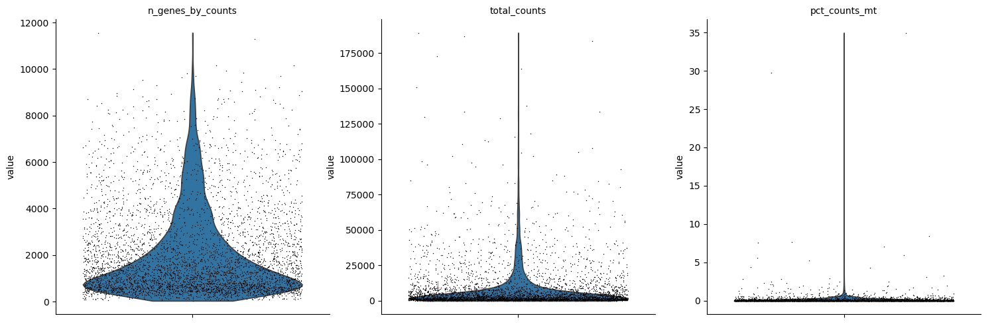

In [28]:
import scanpy as sc
import matplotlib.pyplot as plt

save_path = 'QC_RNA_before_filtration.pdf'
sc.pl.violin(rna_perimarginal, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, save=save_path)

In [30]:
#conda install scikit-image=0.24.0 --no-channel-priority

new_perimarginal = sc.pp.scrublet(rna_perimarginal, adata_sim=None, batch_key=None, sim_doublet_ratio=2.0, expected_doublet_rate=0.05, stdev_doublet_rate=0.02, synthetic_doublet_umi_subsampling=1.0, knn_dist_metric='euclidean', normalize_variance=True, log_transform=False, mean_center=True, n_prin_comps=30, use_approx_neighbors=None, get_doublet_neighbor_parents=False, n_neighbors=None, threshold=None, verbose=True, copy=True, random_state=0)


In [37]:
# Count the total number of entries in 'predicted_doublet'
total_count = new_perimarginal.obs['predicted_doublet'].count()

# Count the number of True values in 'predicted_doublet'
true_count = new_perimarginal.obs['predicted_doublet'].sum()

# Calculate the proportion of True values
true_proportion = true_count / total_count if total_count > 0 else 0

# Display the results
print(f"Total entries: {total_count}")
print(f"Number of True values: {true_count}")
print(f"Proportion of True values: {true_proportion:.2%}")


Total entries: 4563
Number of True values: 21
Proportion of True values: 0.46%


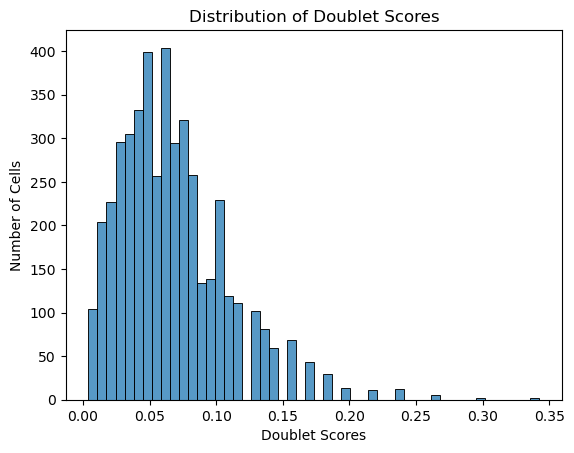

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Access doublet scores
doublet_scores = new_perimarginal.obs['doublet_score']

# Plot histogram using seaborn for better aesthetics (or use plt.hist)
sns.histplot(doublet_scores, bins=50, kde=False)
plt.xlabel('Doublet Scores')
plt.ylabel('Number of Cells')
plt.title('Distribution of Doublet Scores')
plt.show()

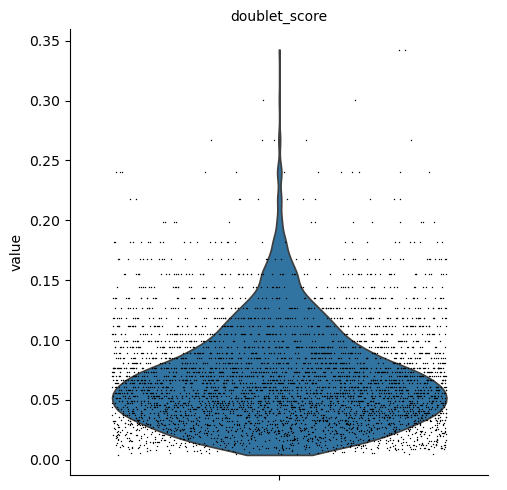

In [39]:
sc.pl.violin(new_perimarginal, ['doublet_score'], jitter=0.4, multi_panel=True, save=save_path)

## Filtration

In [40]:
mu.pp.filter_obs(rna_perimarginal, 'n_genes_by_counts', lambda x: (x >= 300))
# This is analogous to
#   sc.pp.filter_cells(rna, min_genes=200)
#   rna = rna[rna.obs.n_genes_by_counts < 5000, :]
# but does in-place filtering avoiding copying the object

#mu.pp.filter_obs(rna, 'total_counts', lambda x: x < 10000)
mu.pp.filter_obs(rna_perimarginal, 'pct_counts_mt', lambda x: x < 5)

In [42]:
# Initialize the dictionary to store all results
metrics = {}

# QC metrics
metrics["rna_n_genes_by_counts_top"] = None
metrics["rna_n_genes_by_counts_bottom"] = 300
metrics["rna_total_counts_top"] = None
metrics["rna_total_counts_bottom"] = None
metrics["rna_pct_counts_mt"] = 5

# Print QC metrics section
print("QC metrics:")
for key, value in metrics.items():
    print(f"{key}: {value}")

# Part 1: RNA Metrics
metrics["rna_perimarginal_min_total_counts"] = rna_perimarginal.obs['total_counts'].min()
metrics["rna_perimarginal_mean_total_counts"] = rna_perimarginal.obs['total_counts'].mean()
metrics["rna_perimarginal_max_total_counts"] = rna_perimarginal.obs['total_counts'].max()

metrics["rna_perimarginal_min_n_genes_by_counts"] = rna_perimarginal.obs['n_genes_by_counts'].min()
metrics["rna_perimarginal_mean_n_genes_by_counts"] = rna_perimarginal.obs['n_genes_by_counts'].mean()
metrics["rna_perimarginal_max_n_genes_by_counts"] = rna_perimarginal.obs['n_genes_by_counts'].max()

# Print RNA Metrics results
print("\nQC Results:")
for key, value in metrics.items():
    if key.startswith("rna_perimarginal"):
        print(f"{key}: {value}")

# Part 2: Doublet Analysis
# Count the total number of entries in 'predicted_doublet'
total_count = new_perimarginal.obs['predicted_doublet'].count()

# Count the number of True values in 'predicted_doublet'
true_count = new_perimarginal.obs['predicted_doublet'].sum()

# Calculate the proportion of True values
true_proportion = true_count / total_count if total_count > 0 else 0

# Add doublet analysis results to metrics
metrics["doublet_total_entries"] = total_count
metrics["doublet_true_count"] = true_count
metrics["doublet_true_proportion"] = f"{true_proportion:.2%}"

# Print doublet analysis results
print("\nDoublet Analysis Results:")
print(f"Total entries in 'predicted_doublet': {total_count}")
print(f"Number of True values: {true_count}")
print(f"Proportion of True values: {true_proportion:.2%}")

# Save the results to a file
file_path = "QC_filtration_metrics.txt"

with open(file_path, 'w') as file:
    # Write QC metrics
    file.write("QC metrics:\n")
    for key, value in metrics.items():
        if key.startswith("rna_") and not key.startswith("rna_perimarginal"):
            file.write(f"{key}: {value}\n")
    file.write("\n")
    
    # Write RNA metrics
    file.write("QC Results:\n")
    for key, value in metrics.items():
        if key.startswith("rna_perimarginal"):
            file.write(f"{key}: {value}\n")
    file.write("\n")
    
    # Write doublet analysis results
    file.write("Doublet Analysis Results:\n")
    file.write(f"Total entries in 'predicted_doublet': {total_count}\n")
    file.write(f"Number of True values: {true_count}\n")
    file.write(f"Proportion of True values: {true_proportion:.2%}\n")

print(f"Metrics have been written to {file_path}")


QC metrics:
rna_n_genes_by_counts_top: None
rna_n_genes_by_counts_bottom: 300
rna_total_counts_top: None
rna_total_counts_bottom: None
rna_pct_counts_mt: 5

QC Results:
rna_perimarginal_min_total_counts: 328.0
rna_perimarginal_mean_total_counts: 8025.25341796875
rna_perimarginal_max_total_counts: 189372.0
rna_perimarginal_min_n_genes_by_counts: 300
rna_perimarginal_mean_n_genes_by_counts: 2120.6041142857143
rna_perimarginal_max_n_genes_by_counts: 11557

Doublet Analysis Results:
Total entries in 'predicted_doublet': 4563
Number of True values: 21
Proportion of True values: 0.46%
Metrics have been written to QC_filtration_metrics.txt


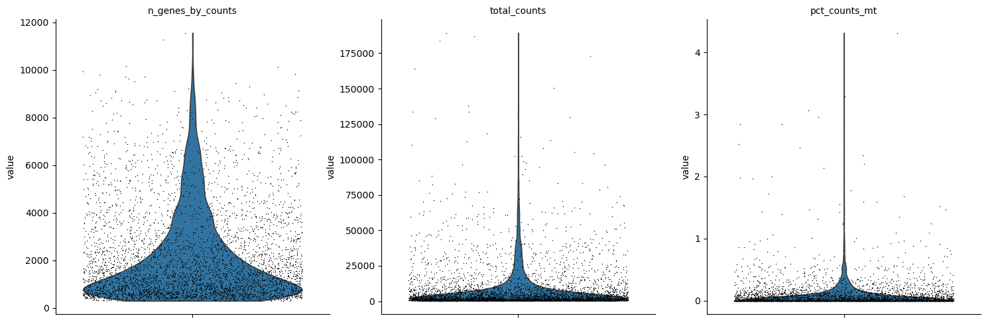

In [43]:
save_path = 'QC_RNA_after_filtration.pdf'
sc.pl.violin(rna_perimarginal, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, save=save_path)


In [44]:
rna_perimarginal = rna_perimarginal[:, ~rna_perimarginal.var['mt'].values] #remove mt genes

In [47]:
sc.pp.normalize_total(rna_perimarginal, target_sum=1e4)

In [48]:
sc.pp.log1p(rna_perimarginal)

In [49]:
sc.pp.highly_variable_genes(rna_perimarginal, min_mean=0.02, max_mean=4, min_disp=0.5)

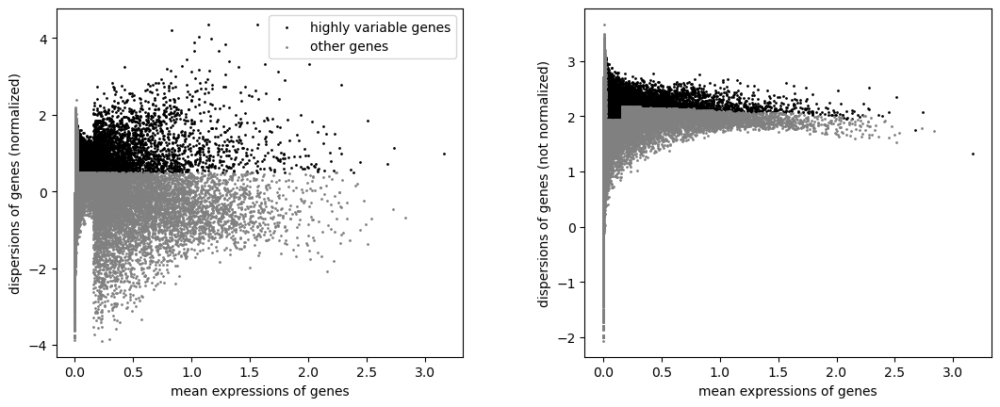

In [50]:
save_path = '.pdf'

sc.pl.highly_variable_genes(rna_perimarginal, save=save_path)


In [51]:
rna_perimarginal.raw = rna_perimarginal 
sc.pp.scale(rna_perimarginal, max_value=10)

In [52]:
rna_perimarginal

AnnData object with n_obs × n_vars = 4375 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [55]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

In [58]:
rna_perimarginal.write(f'{BASE_DIR}/BTROHT01_4_peri_rna_QcFiltered.h5ad')

## Read QC Filtered Data

In [107]:
rna_perimarginal = sc.read(f'{BASE_DIR}/BTROHT01_4_peri_rna_QcFiltered.h5ad')

In [108]:
rna_perimarginal

AnnData object with n_obs × n_vars = 4375 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p'

## PCA and UMAP 

In [109]:
sc.tl.pca(rna_perimarginal, svd_solver='arpack', use_highly_variable=False)

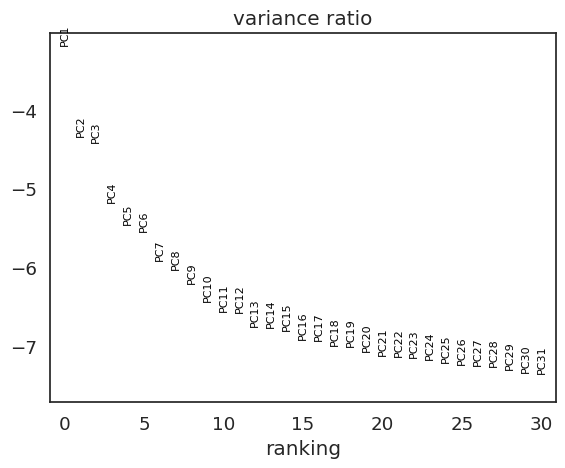

In [110]:
save_path = '.pdf'
sc.pl.pca_variance_ratio(rna_perimarginal, log=True, save=save_path)

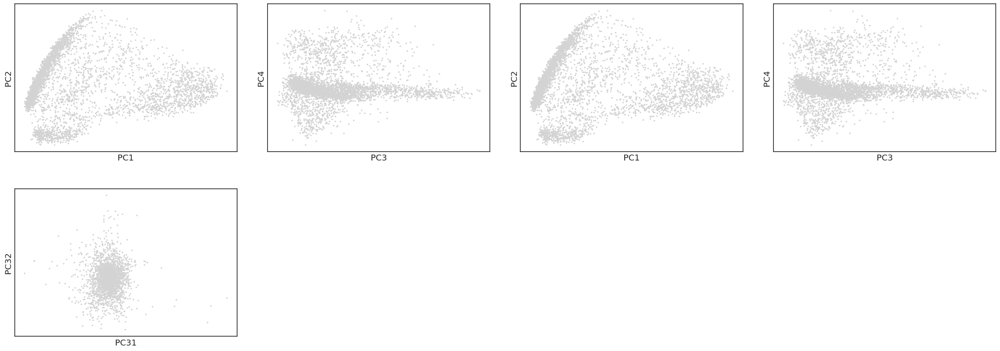

In [111]:
sc.pl.pca(
    rna_perimarginal,
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3),(30,31)]
)

In [112]:
sc.pp.neighbors(rna_perimarginal, n_neighbors=20, n_pcs=25, )

In [113]:
sc.tl.leiden(rna_perimarginal, resolution=1.5, random_state=11)

In [114]:
sc.tl.umap(rna_perimarginal, random_state=11)

In [115]:
rna_perimarginal

AnnData object with n_obs × n_vars = 4375 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

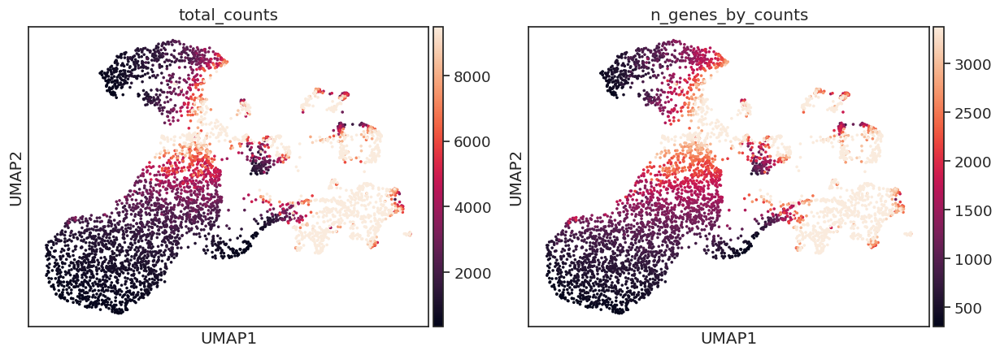

In [116]:
save_path = '_RNA_QC_metrics.pdf'
sc.pl.umap(rna_perimarginal, color=['total_counts', 'n_genes_by_counts'], save=save_path, vmax='p80')

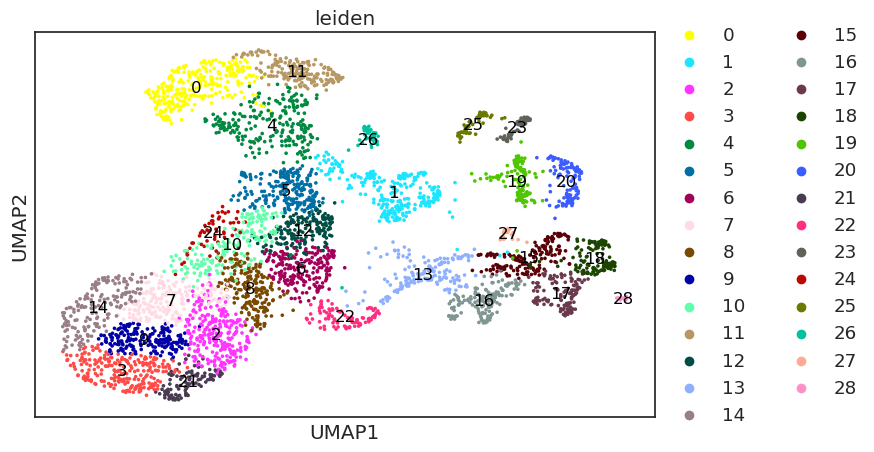

In [117]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(8, 5))  # Adjust the figsize as needed

# Group to plot
group = 'leiden'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster numbers as annotations
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black')

# Adjust layout and spacing
plt.subplots_adjust(wspace=0.7, hspace=0.3)

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT01-perimarginal_leiden_clustering_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT01-perimarginal_leiden_clustering_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight')  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight')  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


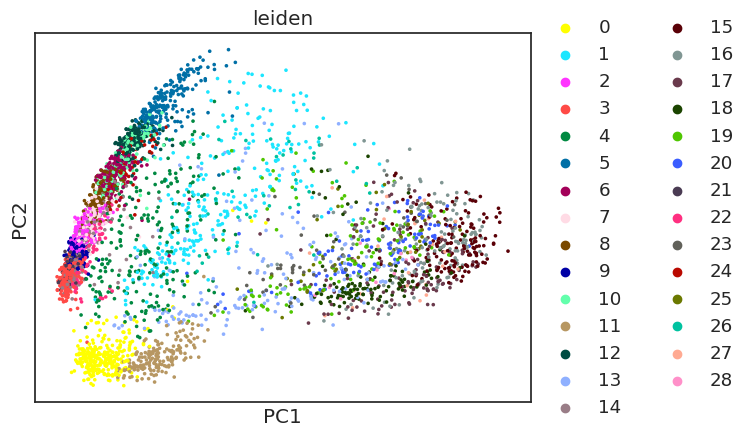

In [118]:
sc.pl.pca(
    rna_perimarginal,
    dimensions=[(0, 1)], color='leiden'
)

## Celltypist for perimarginal

In [119]:
import celltypist
from celltypist import models
models.models_path= '/home/fatemeh.nasrabadi/ROVIGO/models_cell_typist/'

In [120]:
model = models.Model.load(model = 'Adult_Human_PrefrontalCortex.pkl')
predictions_adult = celltypist.annotate(rna_perimarginal, model = 'Adult_Human_PrefrontalCortex.pkl', majority_voting = True)

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 4375 cells and 36588 genes
🔗 Matching reference genes in the model
🧬 3652 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


In [121]:
#scaling for the core yes
#for the perimarginal no

In [122]:
rna_perimarginal.obs['cell_typist_majority_voting_Adult_Human_PrefrontalCortex']=predictions_adult.predicted_labels['majority_voting']
rna_perimarginal.obs['cell_typist_predicted_labels_Adult_Human_PrefrontalCortex']=predictions_adult.predicted_labels['predicted_labels']
rna_perimarginal.obs["celltypist_conf_score_Adult_Human_PrefrontalCortex"] = predictions_adult.to_adata().obs.loc[
    rna_perimarginal.obs.index, "conf_score"
]

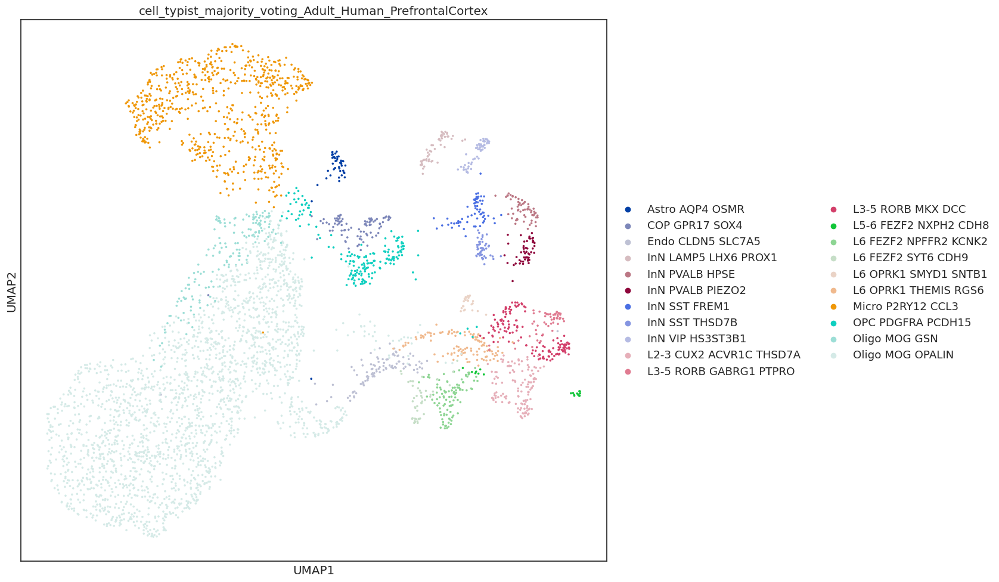

In [123]:
# Assume 'rna_combined' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(17, 10))  # Increase the size

# Group to plot
group = 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Adjust layout and spacing
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.7, hspace=0.3)
plt.tight_layout()  # Automatically adjust subplot parameters

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT01-perimarginal_annotated_plots.png'
save_path_pdf = 'figures/UMAP_BTROHT01-perimarginal_annotated_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', pad_inches=0.1)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', pad_inches=0.1)  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


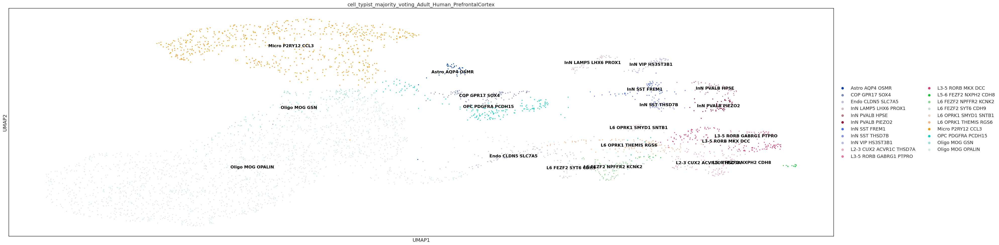

In [124]:
# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(40, 10))  # Increase the size

# Group to plot
group = 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster names at the center of each cluster
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black', fontweight='bold')

# Adjust layout and spacing
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.7, hspace=0.3)
plt.tight_layout()  # Automatically adjust subplot parameters

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT01-perimarginal_annotated_plots.png'
save_path_pdf = 'figures/UMAP_BTROHT01-perimarginal_annotated_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', pad_inches=0.1)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', pad_inches=0.1)  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


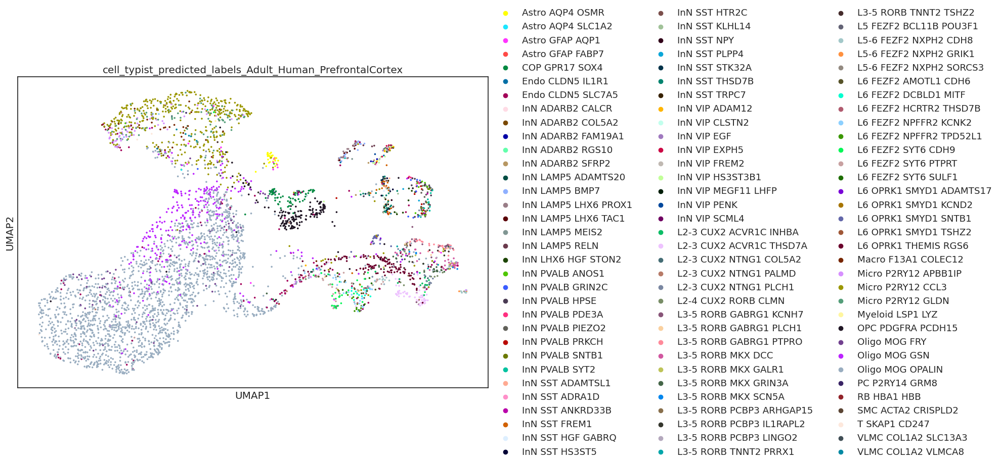

In [125]:


# Assume 'rna_combined' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(12, 8))  # Adjust the figsize as needed

# Group to plot
group = 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Adjust layout and spacing (not really necessary for a single plot, but keeping it in case you expand)
plt.subplots_adjust(wspace=0.7, hspace=0.3)

# Display the plot
plt.show()

# Save the figure
save_path = 'figures/UMAP_BTROHT01-perimarginal_annotated_plots.png'
fig.savefig(save_path)

# Close the figure to free up memory
plt.close(fig)


In [126]:
# sc.tl.dendrogram(rna, groupby='celltype',)
sc.tl.rank_genes_groups(rna_perimarginal, groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names = []
gene_dict = {}

for type in rna_perimarginal.obs['cell_typist_majority_voting_Adult_Human_PrefrontalCortex'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:5]
        gene_names.extend(top_genes)
        gene_dict[type] = top_genes

gene_dict


/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecel

{'InN LAMP5 LHX6 PROX1': array(['FGF13', 'MYO16', 'GAD2', 'GRIP1', 'MTUS2'], dtype=object),
 'Oligo MOG OPALIN': array(['PCDH9', 'IL1RAPL1', 'CTNNA3', 'PLP1', 'TMEM144'], dtype=object),
 'Micro P2RY12 CCL3': array(['ARHGAP24', 'CD74', 'SLC11A1', 'PLXDC2', 'FKBP5'], dtype=object),
 'OPC PDGFRA PCDH15': array(['PTPRZ1', 'LHFPL3', 'PDGFRA', 'MMP16', 'SEMA5A'], dtype=object),
 'Endo CLDN5 SLC7A5': array(['DLGAP1', 'CAMK1D', 'SPTBN4', 'RGS7', 'DNM1'], dtype=object),
 'L6 FEZF2 NPFFR2 KCNK2': array(['MIR137HG', 'CNTNAP5', 'HS3ST4', 'PTPRR', 'KIAA1217'], dtype=object),
 'L6 OPRK1 THEMIS RGS6': array(['RTN4RL1', 'CABP1', 'NELL1', 'CACNA1B', 'SNED1'], dtype=object),
 'L5-6 FEZF2 NXPH2 CDH8': array(['HTR2C', 'CRYM', 'AC068587.4', 'ADCY2', 'TSHZ2'], dtype=object),
 'Oligo MOG GSN': array(['LINC00609', 'DPYSL5', 'LMCD1-AS1', 'TTLL5', 'LRRC63'],
       dtype=object),
 'InN PVALB HPSE': array(['GRIP1', 'PAM', 'TAFA2', 'KCNC2', 'GAD1'], dtype=object),
 'L6 OPRK1 SMYD1 SNTB1': array(['GALNT14', 'DISP3

In [127]:
#Checked genes

#DLGAP1: Neurons 

In [128]:
# sc.tl.dendrogram(rna, groupby='celltype',)
sc.tl.rank_genes_groups(rna_perimarginal, groupby='leiden', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names = []
gene_dict = {}

for type in rna_perimarginal.obs['leiden'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:5]
        gene_names.extend(top_genes)
        gene_dict[type] = top_genes

gene_dict


/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecel

{'25': array(['FGF13', 'MYO16', 'GAD2', 'GRIP1', 'MTUS2'], dtype=object),
 '8': array(['PLEKHH1', 'DOCK5', 'TMEM165', 'CTNNA3', 'COL4A5'], dtype=object),
 '12': array(['C10orf90', 'PHLDB1', 'CREB5', 'CLMN', 'CDH20'], dtype=object),
 '14': array(['PTGDS', 'CRYAB', 'PLP1', 'TUBA1A', 'APOD'], dtype=object),
 '11': array(['LRMDA', 'APBB1IP', 'DOCK8', 'PALD1', 'ARHGAP24'], dtype=object),
 '1': array(['PTPRZ1', 'LHFPL3', 'SOX6', 'MMP16', 'SEMA5A'], dtype=object),
 '13': array(['SPTBN4', 'CAMK1D', 'CHD5', 'DLGAP1', 'CACNA1B'], dtype=object),
 '16': array(['HS3ST4', 'MIR137HG', 'KIAA1217', 'CLSTN2', 'FRMPD4'], dtype=object),
 '0': array(['DOCK4', 'PLXDC2', 'FKBP5', 'ARHGAP24', 'NEAT1'], dtype=object),
 '21': array(['PLCG2', 'MALAT1', 'PCDH9', 'IL1RAPL1', 'QKI'], dtype=object),
 '6': array(['ZNF536', 'AGAP1', 'PALM2-AKAP2', 'POLR2F', 'PRUNE2'], dtype=object),
 '7': array(['PLP1', 'PTGDS', 'TF', 'TMEM144', 'MBP'], dtype=object),
 '10': array(['CNP', 'LANCL1', 'CNTN2', 'ANLN', 'LRP2'], dtype=obje

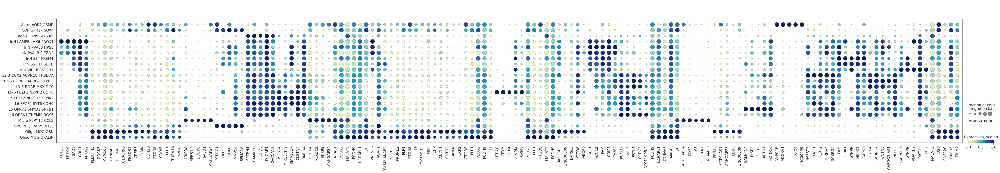

In [129]:
import seaborn as sns
import scanpy as sc

sns.set_theme(style="white", palette="pastel", font_scale=1.2, rc={"lines.linewidth": 0.5})
save_path = '_rna_marker_genes.pdf'

sc.pl.dotplot(rna_perimarginal, var_names=gene_names, 
              groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', colorbar_title='Expression, scaled',
              # categories_order=[ 'Brain neurons', 'mOli', 'Microglia' , 'Astrocytes', 'Tumor cells' ], 
              standard_scale='var', 
              cmap='YlGnBu',  
              dendrogram=False, save=save_path)


## InferCNV

In [130]:
import infercnvpy as cnv
adata_add = cnv.datasets.maynard2020_3k()
adata_add.var.loc[:, ["ensg", "chromosome", "start", "end"]]
adata_add

AnnData object with n_obs × n_vars = 3000 × 55556
    obs: 'age', 'sex', 'sample', 'patient', 'cell_type'
    var: 'ensg', 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_counts', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'cell_type_colors', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

In [131]:
adata_add.obs

,age,sex,sample,patient,cell_type
Run,,,,,
SRR10796381,53,female,LT_S74,TH248,T cell CD4
SRR10787713,40,female,LT_S75,TH266,Macrophage
SRR10785570,56,male,LT_S28,TH185,T cell CD4
SRR10790048,69,female,LT_S65,TH238_NAT,Monocyte
SRR10782528,46,female,LT_S08,TH103,Epithelial cell
...,...,...,...,...,...
SRR10782593,71,female,LT_S47,TH220,Fibroblast
SRR10789971,55,male,LT_S21,TH185,Epithelial cell
SRR10780468,62,male,LT_S58,TH179,Epithelial cell


In [132]:
adata_add.var

,ensg,mito,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_counts,chromosome,start,end,gene_id,gene_name
symbol,,,,,,,,,,,,
AL645933.5,ENSG00000288587.1,False,1854,1.613897,91.340091,34551.914062,34551.914062,chr6,31400702,31463705,ENSG00000288587.1,AL645933.5
AC010184.1,ENSG00000288585.1,False,310,0.412183,98.552011,8824.419922,8824.419922,chr3,141449745,141456434,ENSG00000288585.1,AC010184.1
AC023296.1,ENSG00000288580.1,False,103,0.196091,99.518894,4198.104004,4198.104004,chr8,2923568,2926689,ENSG00000288580.1,AC023296.1
AL117334.2,ENSG00000288577.1,False,176,0.087959,99.177916,1883.123047,1883.123047,chr20,3406380,3410036,ENSG00000288577.1,AL117334.2
AC107294.4,ENSG00000288576.1,False,9,0.023121,99.957962,495.000000,495.000000,chr3,184778723,184780720,ENSG00000288576.1,AC107294.4
...,...,...,...,...,...,...,...,...,...,...,...,...
DOCK8-AS1,ENSG00000183784.7,False,1758,9.321348,91.788500,199560.750000,199560.750000,chr9,212824,215893,ENSG00000183784.7,DOCK8-AS1
LIF-AS1,ENSG00000232530.1,False,265,0.545650,98.762203,11681.813477,11681.813477,chr22,30239194,30240538,ENSG00000232530.1,LIF-AS1
AC093673.1,ENSG00000232533.1,False,3423,15.522471,84.011397,332320.593750,332320.593750,chr7,143379692,143380495,ENSG00000232533.1,AC093673.1


In [133]:
adata_inf=rna_perimarginal.raw.to_adata()
adata_inf.var['end']=adata_add.var.loc[:, ["end"]]
adata_inf.var['start']=adata_add.var.loc[:, ["start"]]
adata_inf.var['chromosome']=adata_add.var.loc[:, ["chromosome"]]
adata_inf.var.loc[:, [ "chromosome", "start", "end"]]

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0
...,...,...,...
AC141272.1,KI270728.1,1270984.0,1271271.0
AC023491.2,KI270731.1,10598.0,13001.0
AC007325.1,KI270734.1,72411.0,74814.0
AC007325.4,KI270734.1,131494.0,137392.0


In [134]:
rna_perimarginal.obs['cell_typist_majority_voting_Adult_Human_PrefrontalCortex'].value_counts()

cell_typist_majority_voting_Adult_Human_PrefrontalCortex
Oligo MOG OPALIN           2154
Micro P2RY12 CCL3           687
OPC PDGFRA PCDH15           184
Oligo MOG GSN               165
L3-5 RORB MKX DCC           135
L2-3 CUX2 ACVR1C THSD7A     123
L6 OPRK1 THEMIS RGS6        113
Endo CLDN5 SLC7A5           103
L6 FEZF2 NPFFR2 KCNK2       103
COP GPR17 SOX4               90
InN SST FREM1                66
InN PVALB HPSE               58
InN VIP HS3ST3B1             56
L3-5 RORB GABRG1 PTPRO       55
InN LAMP5 LHX6 PROX1         51
InN PVALB PIEZO2             51
L6 FEZF2 SYT6 CDH9           47
InN SST THSD7B               47
Astro AQP4 OSMR              43
L6 OPRK1 SMYD1 SNTB1         24
L5-6 FEZF2 NXPH2 CDH8        20
Name: count, dtype: int64

In [135]:
cnv.tl.infercnv(
    adata_inf,
    reference_key="cell_typist_majority_voting_Adult_Human_PrefrontalCortex",
    window_size=250,
    reference_cat=[
        'Micro P2RY12 CCL3',
        'L6 OPRK1 THEMIS RGS6',
        'L3-5 RORB MKX DCC',
        'L6 FEZF2 NPFFR2 KCNK2',  # Corrected
        'InN PVALB HPSE',
        'L2-3 CUX2 ACVR1C THSD7A',  # Corrected
        'InN VIP HS3ST3B1',
        'InN LAMP5 LHX6 PROX1',
        'InN SST THSD7B',
        'InN SST FREM1',
        'L3-5 RORB GABRG1 PTPRO',
        'InN PVALB PIEZO2',
        'L2-3 CUX2 ACVR1C THSD7A',
        'L6 OPRK1 SMYD1 SNTB1'
    ]
)


  0%|          | 0/1 [00:00<?, ?it/s]

In [136]:
#######CHECH THE PARAMETERS#########  

In [137]:
cnv.tl.pca(adata_inf)
cnv.pp.neighbors(adata_inf, )
cnv.tl.leiden(adata_inf,)


/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)



for core 

    
cnv.tl.pca(adata_inf)
cnv.pp.neighbors(adata_inf, )
cnv.tl.leiden(adata_inf,resolution=2)
#cnv.tl.leiden(adata_inf,) #0
#resolution=2

for core 

sc.pp.neighbors(rna_core, n_neighbors=20, n_pcs=25, )
sc.tl.umap(rna_core, random_state=11) #default for min_dist=0.5

to : 
    
sc.pp.neighbors(rna_core, n_neighbors=10, n_pcs=25, )
sc.tl.umap(rna_core, random_state=11,min_dist=0.15)


In [138]:
cnv.tl.umap(adata_inf) #for core min_dist= 0.15
cnv.tl.cnv_score(adata_inf)

In [139]:
#два способа расчета cnv score для отдельной клетки
rna_perimarginal.obs['cnv_raw_l1'] = pd.DataFrame(np.ravel(np.mean(np.abs(adata_inf.obsm[f"X_cnv"]), axis=1)), 
                                     index=rna_perimarginal.obs.index)
rna_perimarginal.obs['cnv_raw_l2'] = pd.DataFrame(np.ravel(np.mean((adata_inf.obsm[f"X_cnv"]).power(2), axis=1))**.5, 
                                     index=rna_perimarginal.obs.index)
rna_perimarginal.obs['cnv_score']=adata_inf.obs['cnv_score']
rna_perimarginal.obs['cnv_leiden']=adata_inf.obs['cnv_leiden']

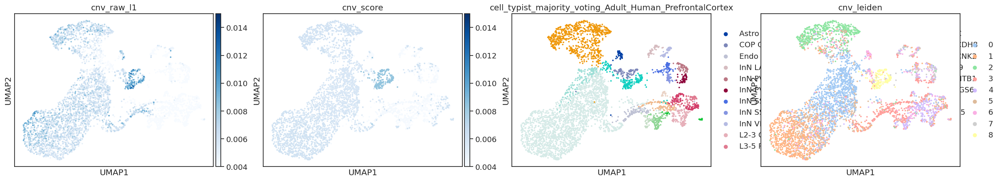

In [140]:
save_path='_rna_cnv.pdf'

sc.pl.umap(rna_perimarginal, ncols=4, color=['cnv_raw_l1', 'cnv_score', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cnv_leiden'], 
            color_map='Blues', vmax=0.015, vmin=0.004, save=save_path)

... storing 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex' as categorical


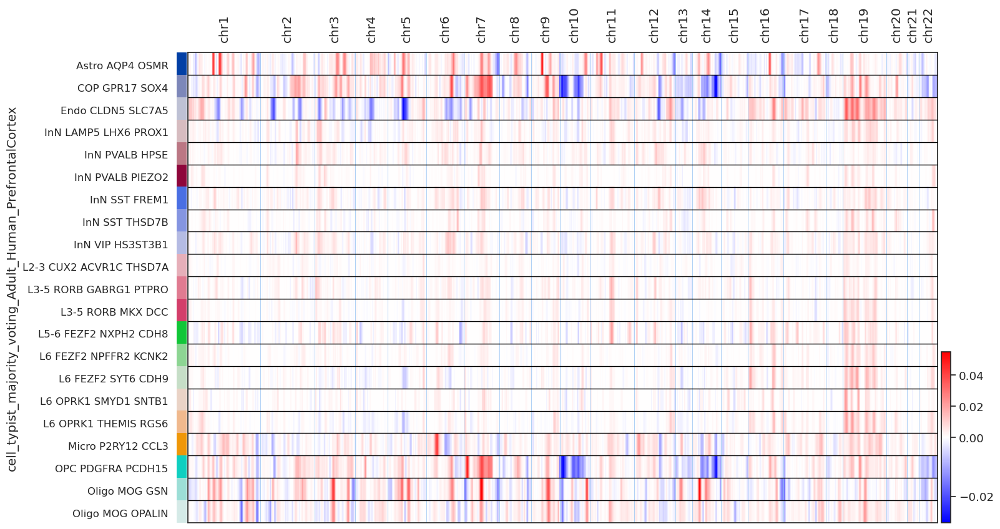

In [141]:
save_path='_rna_cnv_heatmap_celltypist.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="cell_typist_majority_voting_Adult_Human_PrefrontalCortex", save=save_path)

... storing 'leiden' as categorical


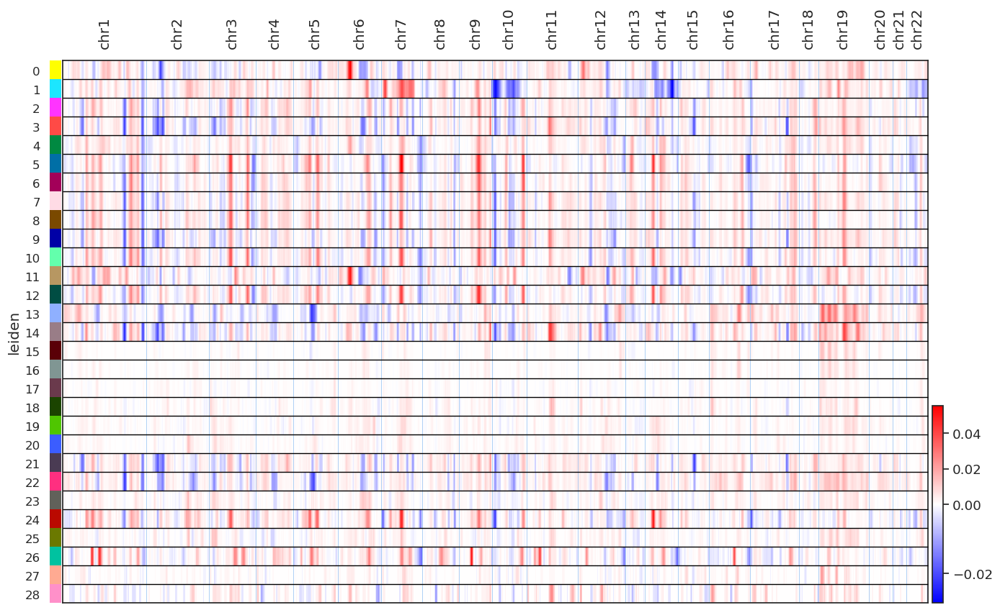

In [142]:
save_path='_rna_cnv_heatmap_lieden.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="leiden", save= save_path)

... storing 'cnv_leiden' as categorical


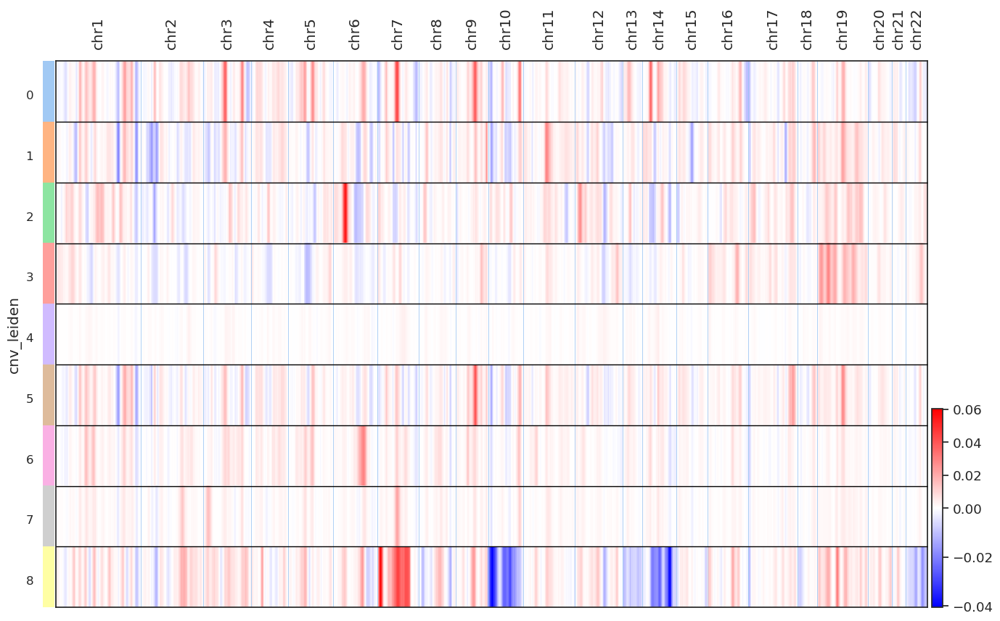

In [143]:
save_path='_rna_cnv_heatmap_cnv_leiden.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="cnv_leiden")

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: Astro AQP4 OSMR, COP GPR17 SOX4, Endo CLDN5 SLC7A5, etc.
var_group_labels: chr1, chr2, chr3, etc.


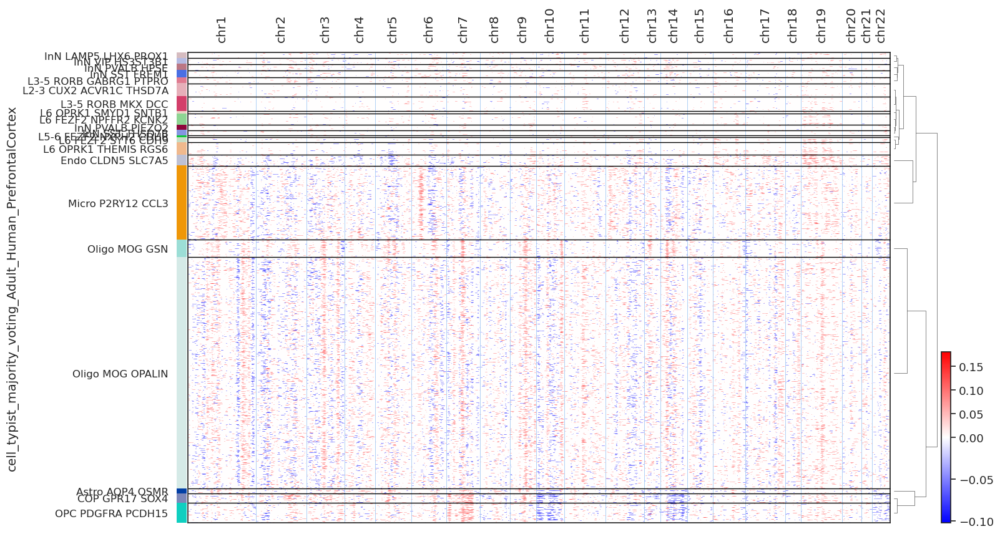

In [144]:
cnv.pl.chromosome_heatmap(adata_inf, groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', dendrogram=True)

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


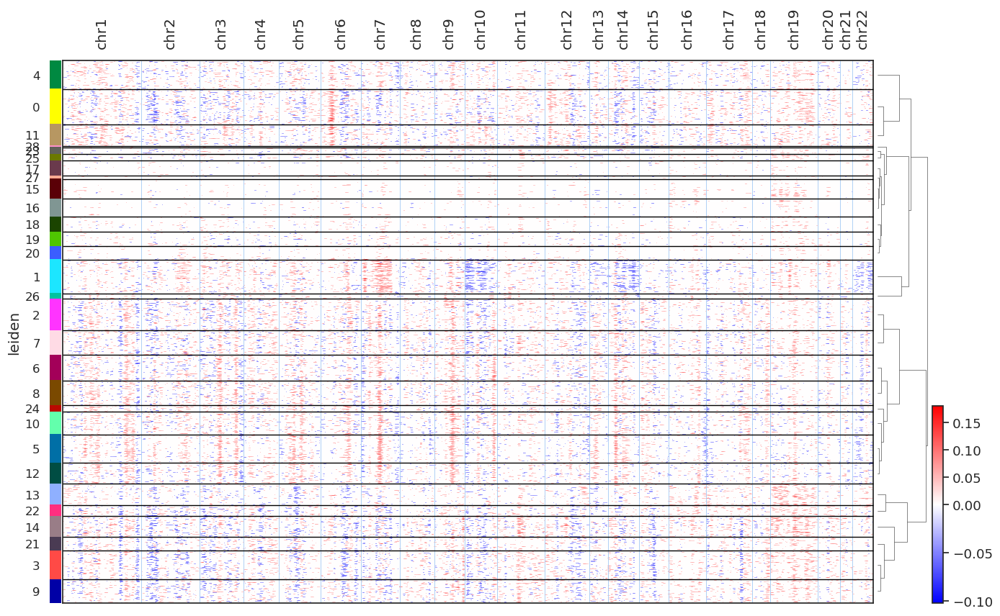

In [145]:
cnv.pl.chromosome_heatmap(adata_inf, groupby="leiden", dendrogram=True)

categories: Astro AQP4 OSMR, COP GPR17 SOX4, Endo CLDN5 SLC7A5, etc.
var_group_labels: chr1, chr2, chr3, etc.


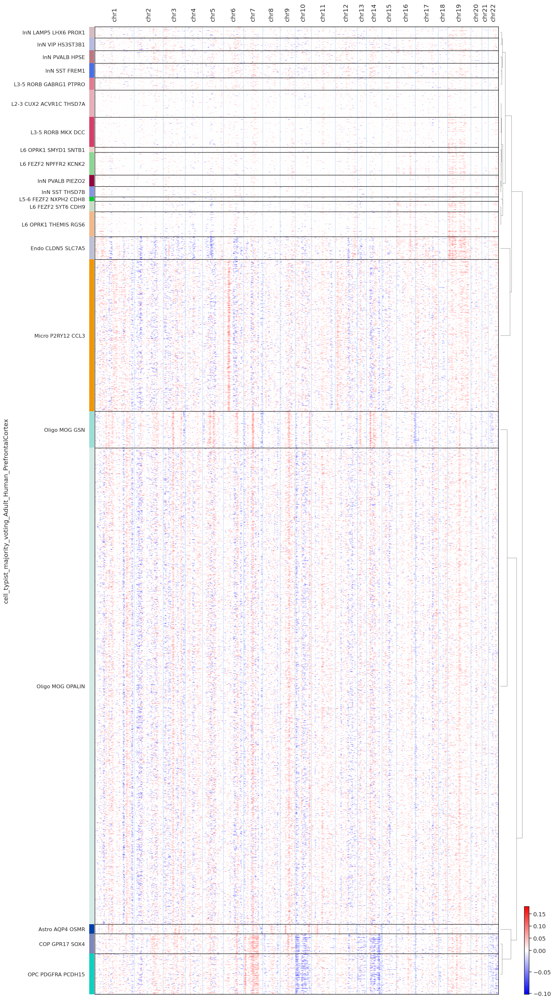

In [146]:
cnv.pl.chromosome_heatmap(adata_inf, groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', dendrogram=True, figsize = (18,40))

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


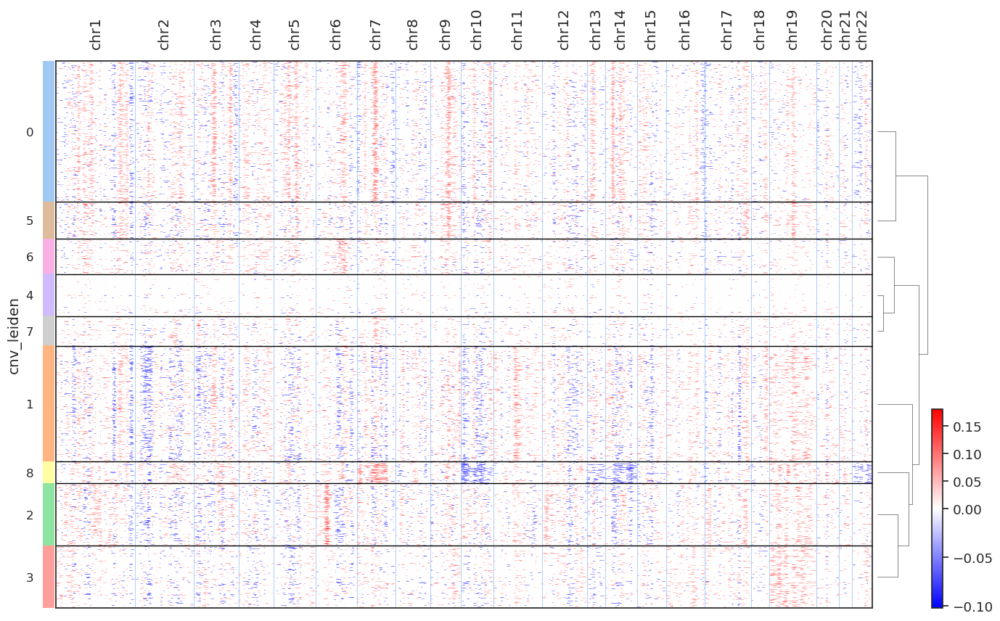

In [147]:
cnv.pl.chromosome_heatmap(adata_inf, groupby="cnv_leiden", dendrogram=True)

In [148]:
# Create a new mapping for cell types based on Leiden clusters with full names
cluster_to_celltype = {
    "4": "Immune Cells", "0": "Immune Cells", "11": "Immune Cells",
    "3": "Oligodendrocytes", "21": "Oligodendrocytes", "9": "Oligodendrocytes", 
    "14": "Oligodendrocytes", "7": "Oligodendrocytes", "2": "Oligodendrocytes", 
    "10": "Oligodendrocytes", "8": "Oligodendrocytes", "24": "Oligodendrocytes", 
    "12": "Oligodendrocytes", "6": "Oligodendrocytes", "5":"Oligodendrocytes","24": "Oligodendrocytes",
    "26": "Astrocytes",
    "1": "Tumor Cells",
    "25": "IN-LAMP5", "22": "Neurons", "17": "Neurons", 
    "23": "IN-VIP","19": "IN-SST", "16": "Neurons", "18": "Neurons", "13": "Neurons", 
    "15": "Neurons", "20": "IN-PVALB", "28":"Neurons","27":"Neurons"
}

# Map the Leiden clusters to cell types with full names
rna_perimarginal.obs['celltype'] = rna_perimarginal.obs['leiden'].map(cluster_to_celltype)

In [149]:
rna_perimarginal.obs['celltype'].value_counts()

celltype
Oligodendrocytes    2196
Neurons              848
Immune Cells         686
Tumor Cells          272
IN-SST               115
IN-PVALB             109
IN-VIP                56
IN-LAMP5              51
Astrocytes            42
Name: count, dtype: int64

... storing 'celltype' as categorical


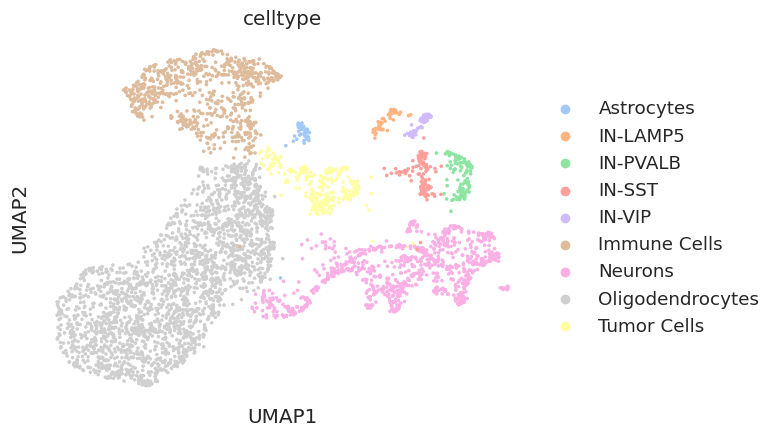

In [150]:
import matplotlib.pyplot as plt
import scanpy as sc

# Plot UMAP without the box around it
sc.pl.umap(rna_perimarginal, color=['celltype'], vmax=20000, show=False)

# Remove the box by hiding spines in the current figure's axis
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.show()


In [151]:
rna_perimarginal.obs['UMAP of Gene Expression in BTROHT01-Perimarginal'] = rna_perimarginal.obs['celltype'] 

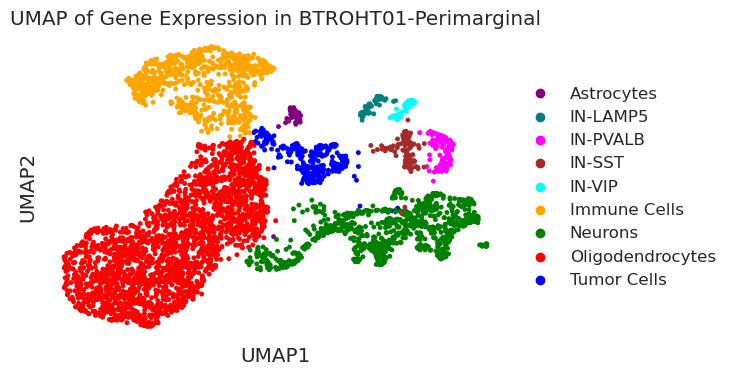

In [152]:
import matplotlib.pyplot as plt
import scanpy as sc

cell_type_colors = {
    'Oligodendrocytes': 'red',
    'Neurons': 'green',
    'Immune Cells': 'orange',
    'Tumor Cells': 'blue',
    'Astrocytes': 'purple',
    'IN-LAMP5': 'teal',       # Assigned color
    'IN-PVALB': 'magenta',    # Assigned color
    'IN-SST': 'brown',        # Assigned color
    'IN-VIP': 'cyan'          # Assigned color
}

# Create a UMAP plot and prevent it from showing immediately
sc.pl.umap(
    rna_perimarginal, 
    color='UMAP of Gene Expression in BTROHT01-Perimarginal',  # Update this to your actual cell type annotation key
    vmax=20000, 
    show=False, 
    palette=cell_type_colors,
    size=50,  # Adjust size of the dots
    legend_fontsize=12  # Adjust size of legend text
)

# Get the current figure
fig = plt.gcf()  # This gets the current figure object

# Adjust the figure size
fig.set_size_inches(6, 4)  # Adjust width and height

# Remove the box around the plot by hiding the spines
ax = plt.gca()  # Get the current axis
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Save the figure
save_path_png = 'figures/UMAP_BTROHT01_Peri_annotation_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT01_Peri_annotation_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', dpi=300)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', dpi=300)  # Save as PDF with tight bounding box

# Show the plot
plt.show()


## Cell cycle Analysis 

... storing 'phase' as categorical


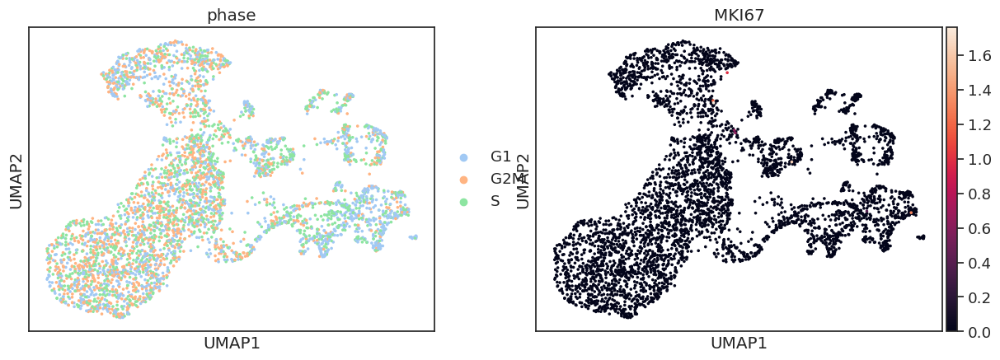

In [153]:
cell_cycle_genes = [x.strip() for x in open('/home/fatemeh.nasrabadi/files/cellcycle/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in rna_perimarginal.var_names]
sc.tl.score_genes_cell_cycle(rna_perimarginal, s_genes=s_genes, g2m_genes=g2m_genes, use_raw=False)
save_path='_rna_cellcycle.pdf'
sc.pl.umap(rna_perimarginal, color=['phase', 'MKI67'], save=save_path)

In [154]:
#sc.tl.dendrogram(rna_core, groupby='celltype_new_CNV_leiden',)
sc.tl.dendrogram(rna_perimarginal, groupby='celltype',)

In [155]:
sc.tl.dendrogram(rna_perimarginal, groupby='celltype')
sc.tl.rank_genes_groups(rna_perimarginal, groupby='celltype', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names=[]
gene_dict={}
for type in rna_perimarginal.obs['celltype'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:15]
        gene_names.extend(top_genes)
        gene_dict[type]=top_genes
        
gene_dict


{'IN-LAMP5': array(['FGF13', 'MYO16', 'GAD2', 'GRIP1', 'MTUS2', 'GRIA1', 'TMEM132D',
        'PTPRT', 'GRM5', 'FSTL5', 'GALNT18', 'SGCZ', 'RBMS3', 'ATP8A2',
        'GAD1'], dtype=object),
 'Oligodendrocytes': array(['PCDH9', 'IL1RAPL1', 'CTNNA3', 'PLP1', 'TMEM144', 'TF', 'MBP',
        'ST18', 'EDIL3', 'SIK3', 'SLC44A1', 'MAN2A1', 'PIP4K2A', 'MAGI2',
        'QKI'], dtype=object),
 'Immune Cells': array(['ARHGAP24', 'CD74', 'SLC11A1', 'PLXDC2', 'FKBP5', 'SLC1A3',
        'ADAM28', 'DOCK4', 'BMP2K', 'FRMD4A', 'LRMDA', 'MEF2A', 'SAT1',
        'OLR1', 'CTSB'], dtype=object),
 'Tumor Cells': array(['PTPRZ1', 'LHFPL3', 'SOX6', 'MMP16', 'SEMA5A', 'VCAN', 'TNR',
        'BCAN', 'FGF12', 'OPHN1', 'MAP2', 'SOX5', 'GRIK2', 'DSCAM',
        'MEGF11'], dtype=object),
 'Neurons': array(['CACNA1B', 'ZFYVE28', 'KIAA1211L', 'GALNT17', 'CHD5', 'NELL2',
        'STXBP5L', 'HS3ST2', 'SYN2', 'ANKRD33B', 'HECW1', 'CACNA1C',
        'AGBL4', 'PHACTR1', 'MEG3'], dtype=object),
 'IN-PVALB': array(['GAD1', '

In [156]:
sc.tl.dendrogram(rna_perimarginal, groupby='leiden',)
sc.tl.rank_genes_groups(rna_perimarginal, groupby='leiden', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names=[]
gene_dict={}
for type in rna_perimarginal.obs['leiden'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:15]
        gene_names.extend(top_genes)
        gene_dict[type]=top_genes
        
gene_dict


/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecel

{'25': array(['FGF13', 'MYO16', 'GAD2', 'GRIP1', 'MTUS2', 'GRIA1', 'TMEM132D',
        'PTPRT', 'GRM5', 'FSTL5', 'GALNT18', 'SGCZ', 'RBMS3', 'ATP8A2',
        'GAD1'], dtype=object),
 '8': array(['PLEKHH1', 'DOCK5', 'TMEM165', 'CTNNA3', 'COL4A5', 'ST18', 'EDIL3',
        'MAP7', 'MBP', 'C10orf90', 'DOCK10', 'MAGI2', 'TMEM144', 'PIP4K2A',
        'KLHL32'], dtype=object),
 '12': array(['C10orf90', 'PHLDB1', 'CREB5', 'CLMN', 'CDH20', 'SLC7A14-AS1',
        'KCNH8', 'APBB2', 'POLR2F', 'ENOSF1', 'ZNF536', 'COBL', 'BCAS1',
        'PALM2-AKAP2', 'DOCK1'], dtype=object),
 '14': array(['PTGDS', 'CRYAB', 'PLP1', 'TUBA1A', 'APOD', 'SCD', 'RNASE1', 'CNP',
        'DPYSL2', 'FTH1', 'GPM6B', 'DBNDD2', 'TF', 'PPP1R14A', 'GAPDH'],
       dtype=object),
 '11': array(['LRMDA', 'APBB1IP', 'DOCK8', 'PALD1', 'ARHGAP24', 'ST6GAL1',
        'ADAM28', 'SLCO2B1', 'SRGN', 'SFMBT2', 'RHBDF2', 'FRMD4A', 'DLEU1',
        'ITPR2', 'CD74'], dtype=object),
 '1': array(['PTPRZ1', 'LHFPL3', 'SOX6', 'MMP16', 'SEMA5A',

In [ ]:
stop

In [157]:
celltype_genes = [
    # Astrocyte markers
    'RFX4', 'ADGRV1', 'GPC5', 'GFAP', 'MRVI1',
    
    # Microglial markers
    'ADAM28', 'SLC11A1', 'PLXDC2', 'BMP2K', 'SPP1',
    
    # Neuron markers
    'SYT1', 'RIMS2', 'DLGAP2', 'GRIN2B', 'CCSER1',
    
    # Oligodendrocyte markers
    'MBP', 'CTNNA3', 'EDIL3', 'MAN2A1', 'PIP4K2A',
    
    # Tumor markers
    'PTPRZ1', 'LHFPL3', 'SEMA5A', 'SOX6', 'BCAN',
    #
    #'GAD1', 'KCNC2', 'PAM', 'GRIP1', 'TAFA2',
    #'GRIN2A','GAD1','SLC32A1','LAMP5','RELN'
]


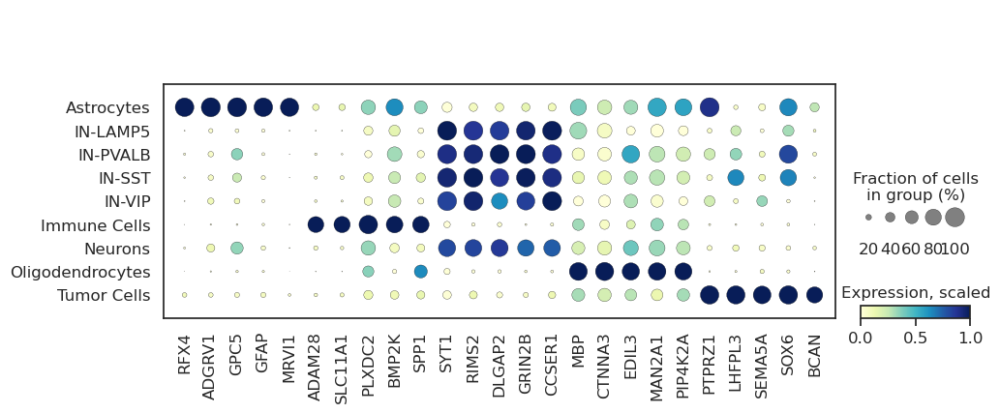

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

# Configure the Seaborn theme
sns.set_theme(style="white", palette="pastel", font_scale=1.2, rc={"lines.linewidth": 0.5})

# Generate the dotplot without saving it directly in Scanpy
sc.pl.dotplot(
    rna_perimarginal, 
    var_names=celltype_genes, 
    groupby='celltype',
    colorbar_title='Expression, scaled',
    # categories_order=['Brain neurons', 'mOli', 'Microglia', 'Astrocytes', 'Tumor cells'],  # Uncomment if needed
    standard_scale='var',
    cmap='YlGnBu',
    dendrogram=False,
    show=False  # Prevent Scanpy from immediately displaying the plot
)

# Save the figure manually for PNG and PDF formats
fig = plt.gcf()  # Capture current figure
fig.canvas.draw()  # Ensure canvas is updated

# Custom save paths
save_path_png = 'figures/BTROHT01-perimarginal_dotplot_annotated_plots.jpg'
save_path_pdf = 'figures/BTROHT01-perimarginal_dotplot_annotated_plots.pdf'

# Save the figure
fig.savefig(save_path_png, bbox_inches='tight', dpi=300)  # Save as PNG
fig.savefig(save_path_pdf, bbox_inches='tight', dpi=300)  # Save as PDF

# Display the plot
plt.show()


... storing 'celltype' as categorical


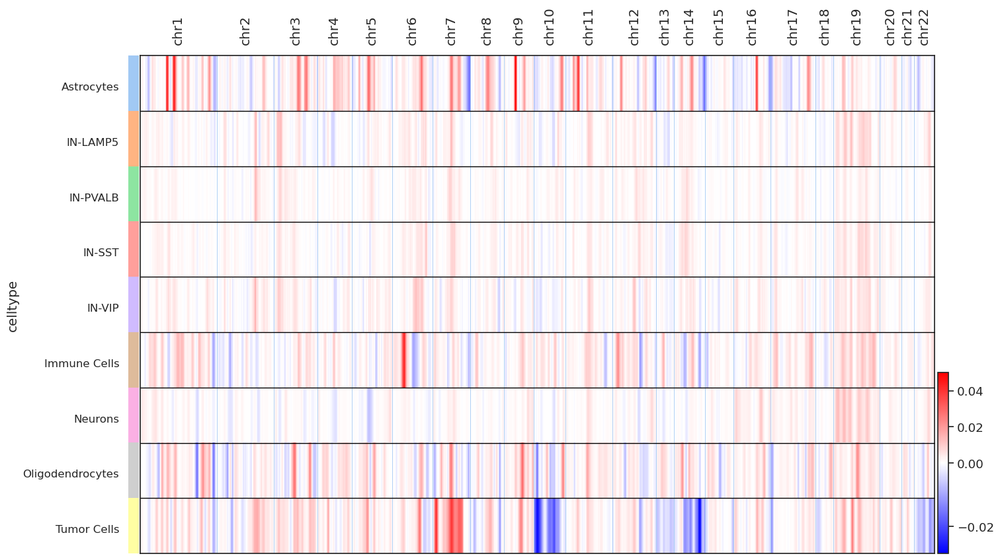

In [161]:
adata_inf.obs['celltype']=rna_perimarginal.obs['celltype']
save_path='_rna_cnv_heatmap_celltype.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="celltype", save=save_path)

... storing 'celltype' as categorical


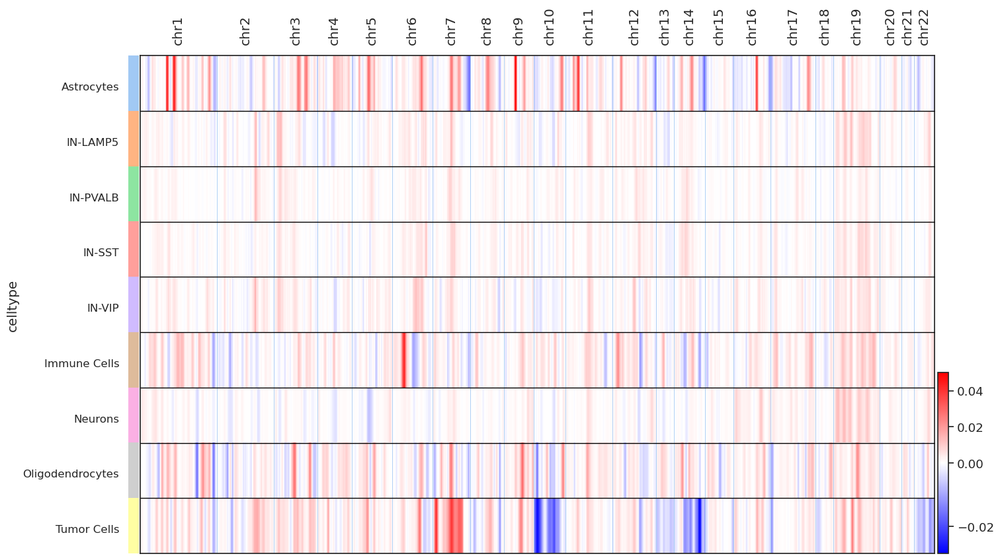

<Figure size 640x480 with 0 Axes>

In [162]:
import matplotlib.pyplot as plt

# Step 1: Map the new celltype labels
adata_inf.obs['celltype'] = rna_perimarginal.obs['celltype']

# Step 2: Set all the colors to a single color (e.g., grey)
uniform_color = '#808080'  # Grey color for all cell types
adata_inf.uns['celltype_new_colors'] = [uniform_color] * len(adata_inf.obs['celltype'].unique())

# Step 3: Plot the heatmap with the uniform coloring and save the figure
save_path = '_rna_cnv_heatmap_celltype.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="celltype", save=save_path)

# Optionally save in other formats
save_path_png = 'figures/UMAP_BTROHT01-perimarginal_CNV_annotated_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT01-perimarginal_CNV_annotated_plots.pdf'
fig = plt.gcf()  # Get the current figure
fig.savefig(save_path_png, bbox_inches='tight', dpi=300)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', dpi=300)  # Save as PDF with tight bounding box

# Step 4: Display the heatmap
plt.show()


## Save Final Version 

In [164]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

In [165]:
# Save the file
rna_perimarginal.write(f'{BASE_DIR}/BTROHT01_5_peri_rna_ANNOTATED_FINAL.h5ad')

## Reading RNA and ATAC DATA

In [27]:
import scanpy as sc

import muon as mu

from muon import atac as ac
from muon import prot as pt

import scipy
import numpy as np 
import pandas as pd
 
from matplotlib import pyplot as plt
import seaborn as sns

import pandas as pd


In [28]:
rna_perimarginal = sc.read(f'{BASE_DIR}/BTROHT01_5_peri_rna_ANNOTATED_FINAL.h5ad')

In [29]:
rna_perimarginal

AnnData object with n_obs × n_vars = 4375 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltypist_conf_score_Adult_Human_PrefrontalCortex', 'cnv_raw_l1', 'cnv_raw_l2', 'cnv_score', 'cnv_leiden', 'celltype', 'UMAP of Gene Expression in BTROHT01-Perimarginal', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'UMAP of Gene Expression in BTROHT01-Perimarginal_colors', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex_colors', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex_colors', 'celltype_colors', 'cnv_leiden_colors

In [30]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

In [147]:
atac = sc.read(f'{BASE_DIR}/BTROHT01_3_peri_raw_atac.h5ad')

## ATAC seq Analysis 

In [190]:
#atac = mdata_perimarginal.mod['atac']
#atac

## QC for ATAC 

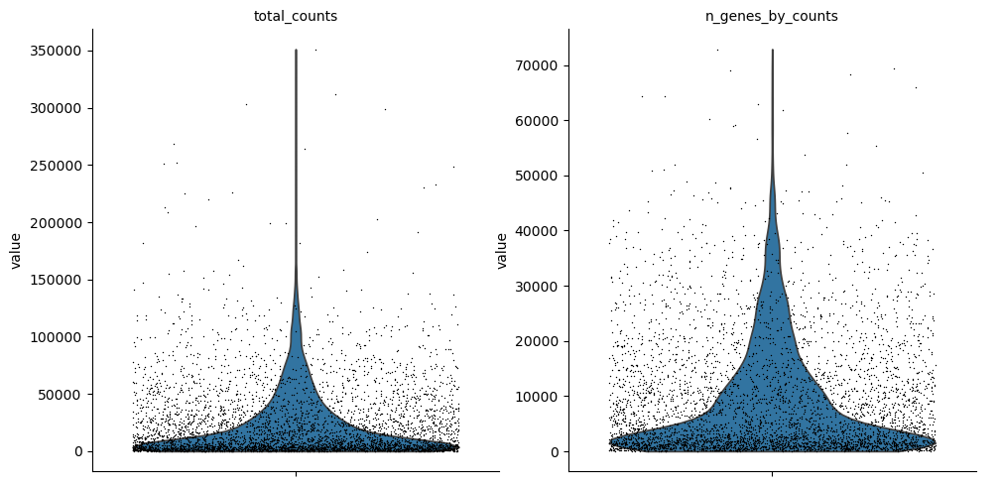

In [148]:
sc.pp.calculate_qc_metrics(atac, percent_top=None, log1p=False, inplace=True)

save_path = 'QC_ATAC_before_filtration.pdf'
sc.pl.violin(atac, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True, save=save_path)

## Nucleosome signal

In [149]:
#Nuc signeal

# Calculate the nucleosome signal across cells
# set n=10e3*atac.n_obs for rough estimate but faster run time
ac.tl.nucleosome_signal(atac, n=10e3 * atac.n_obs)

Reading Fragments: 100%|██████████| 45630000/45630000 [02:02<00:00, 373636.31it/s]


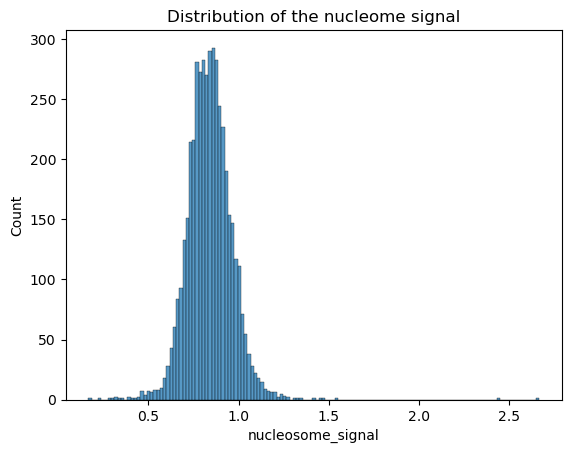

In [150]:
sns.histplot(atac.obs, x="nucleosome_signal")
plt.title("Distribution of the nucleome signal")
plt.show()

## Filtration

In [151]:
mu.pp.filter_var(atac, "n_cells_by_counts", lambda x: x >= 5)

In [152]:
# mu.pp.filter_obs(
#     atac,
#     "tss_score",
#     lambda x: x >= 2,
# )
print(f"Number of cells after filtering on tss_score: {atac.n_obs}")
mu.pp.filter_obs(atac, "nucleosome_signal", lambda x: x <= 2)
print(f"Number of cells after filtering on nucleosome_signal: {atac.n_obs}")

Number of cells after filtering on tss_score: 4563
Number of cells after filtering on nucleosome_signal: 4561


In [153]:
mu.pp.filter_obs(atac, 'n_genes_by_counts', lambda x: (x >= 2000) & (x <= 50000))
# This is analogous to
#   sc.pp.filter_cells(atac, max_genes=15000)
#   sc.pp.filter_cells(atac, min_genes=2000)
# but does in-place filtering avoiding copying the object

#mu.pp.filter_obs(
#    atac,
#    "total_counts",
#    lambda x: (x >= 500) & (x <= 150000), 
#)
print(f"Number of cells after filtering on n fragments: {atac.n_obs}")

Number of cells after filtering on n fragments: 3123


In [154]:
# Define the metrics
atac_metrics = {
    "atac_n_cells_by_counts": 5,
    "atac_n_genes_by_counts_bottom": 2000,
    "atac_n_genes_by_counts_top": 50000,
   # "atac_total_counts_top": 500,
   # "atac_total_counts_bottom": 150000,
}

# Define the file path
file_path = "QC_filtration_metrics.txt"

with open(file_path, 'a') as file:
    for key, value in atac_metrics.items():
        file.write(f"{key}: {value}\n")

print(f"Metrics have been written and appended to {file_path}")

Metrics have been written and appended to QC_filtration_metrics.txt


In [155]:
atac.write(f'{BASE_DIR}/BTROHT01_6_peri_atac_QcFiltered.h5ad')

In [ ]:
atac.close()

In [ ]:
atac = sc.read(f'{BASE_DIR}/BTROHT01_3_core_atac_raw.h5ad')

## SnapATAC and filtration

In [32]:
import snapatac2 as snap
import numpy as np
import scanpy as sc

snap.__version__

'2.7.0'

In [33]:
#Choose barcodes from filtered data (filtered with muon)
valid_barcodes=atac.obs_names
len(valid_barcodes)

3123

In [34]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

In [ ]:
x

In [144]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal'

In [36]:
%%time

data = snap.pp.import_data(
    f'{BASE_DIR}/Snap/atac_fragments.tsv',
    chrom_sizes=snap.genome.hg38,
    file=f'{BASE_DIR}/Snap/BTROHT_01_perimarginal_snap.h5ad',  # Optional
    sorted_by_barcode=False, whitelist=valid_barcodes,
    tempdir=f'{BASE_DIR}/Snap/tmpdir'
)
data


CPU times: user 12min 23s, sys: 49.4 s, total: 13min 13s
Wall time: 14min 16s


AnnData object with n_obs x n_vars = 3123 x 0 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal/Snap/BTROHT_01_perimarginal_snap.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

In [37]:
data.close()

In [ ]:
!pwd

# Read Snap ATAC

In [38]:
data=snap.read(f'{BASE_DIR}/Snap/BTROHT_01_perimarginal_snap.h5ad', )
data

AnnData object with n_obs x n_vars = 3123 x 0 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal/Snap/BTROHT_01_perimarginal_snap.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

## QC

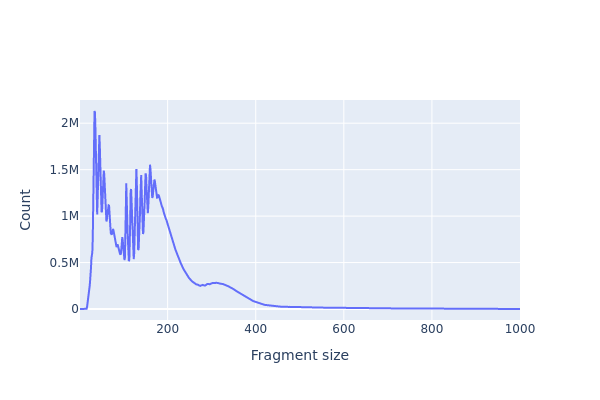

In [44]:
snap.pl.frag_size_distr(data, interactive=False, out_file='figures/QC_ATAC_frag_size_distr.pdf')

In [45]:
#%%time
snap.metrics.tsse(data, snap.genome.hg38)

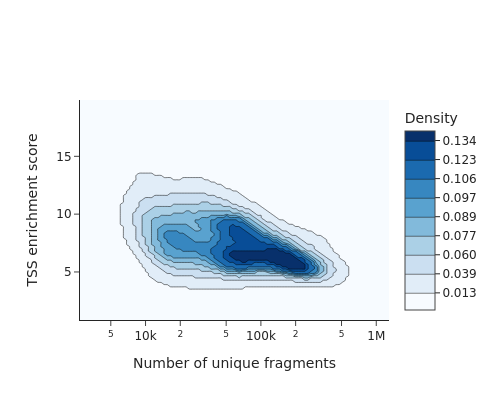

In [46]:
snap.pl.tsse(data, interactive=False, out_file='figures/QC_ATAC_tsse_frags.pdf')

In [47]:
data.obs['tsse'].min()

/tmp/ipykernel_2257645/1383754455.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



2.6147186147186146

In [48]:
data.obs['tsse'].mean()

/tmp/ipykernel_2257645/921509436.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



7.6517480736528745

In [41]:
## Add tile matrix, select features, remove doublets, 

In [49]:
%%time
snap.pp.add_tile_matrix(data) #add tile matrix with 500 bp window

CPU times: user 2min 18s, sys: 8.42 s, total: 2min 26s
Wall time: 1min 59s


In [50]:
snap.pp.select_features(data, n_features=25000) #feature selection to find the most variable
%%time
snap.pp.scrublet(data) #doublet identification
snap.pp.filter_doublets(data) #doublet removal
data

2024-11-27 19:04:34 - INFO - Selected 25000 features.
UsageError: Line magic function `%%time` not found.


In [51]:
data.write(f'{BASE_DIR}/Snap/BTROHT_01_perimarginal_snap_filtered.h5ad', )

In [52]:
data.close()

In [53]:
data = snap.read(f'{BASE_DIR}/Snap/BTROHT_01_perimarginal_snap_filtered.h5ad', )

In [54]:
data

AnnData object with n_obs x n_vars = 3123 x 6062095 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal/Snap/BTROHT_01_perimarginal_snap_filtered.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    var: 'count', 'selected'
    uns: 'library_tsse', 'frac_overlap_TSS', 'reference_sequences', 'TSS_profile', 'frag_size_distr'
    obsm: 'fragment_paired'

## Reducing Dimention 

In [55]:
#%%time
snap.tl.spectral(data, n_comps=40)

In [56]:
#%%time
snap.tl.umap(data, )

/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [57]:
#%%time
snap.pp.knn(data)
snap.tl.leiden(data)

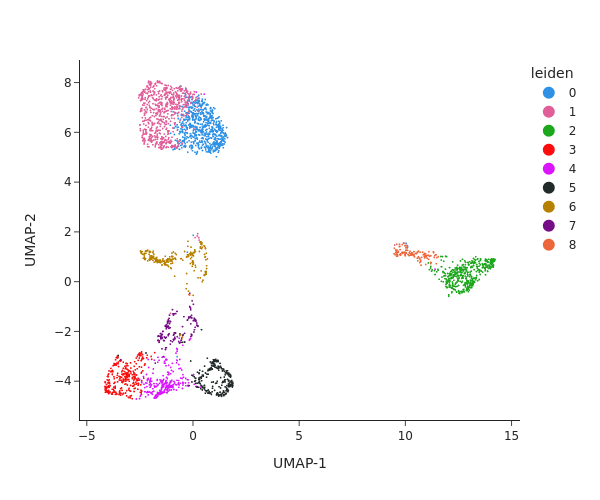

In [58]:
snap.pl.umap(data, color='leiden', interactive=False, height=500)

In [59]:
data.close()

In [60]:
data

Closed AnnData object

## Cluster Annotation 

In [61]:
data = snap.read(f'{BASE_DIR}/Snap/BTROHT_01_perimarginal_snap_filtered.h5ad', )
data

AnnData object with n_obs x n_vars = 3123 x 6062095 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Perimarginal/Snap/BTROHT_01_perimarginal_snap_filtered.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    var: 'count', 'selected'
    uns: 'reference_sequences', 'frag_size_distr', 'spectral_eigenvalue', 'frac_overlap_TSS', 'TSS_profile', 'library_tsse'
    obsm: 'X_spectral', 'X_umap', 'fragment_paired'
    obsp: 'distances'

In [62]:
%%time
gene_matrix = snap.pp.make_gene_matrix(data, snap.genome.hg38, )
gene_matrix

/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning:

Transforming to str index.



CPU times: user 5min 42s, sys: 14.1 s, total: 5min 56s
Wall time: 2min 6s


AnnData object with n_obs × n_vars = 3123 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'

In [63]:
# Initialize all values in gene_matrix.obs['annotation'] as None
gene_matrix.obs['celltype'] = None

# Update the annotation for cells that are present in both gene_matrix.obs and data.obs
common_cells = gene_matrix.obs.index.intersection(rna_perimarginal.obs.index)
gene_matrix.obs.loc[common_cells, 'celltype'] = rna_perimarginal.obs.loc[common_cells, 'celltype']

In [64]:
gene_matrix

AnnData object with n_obs × n_vars = 3123 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype'

In [65]:
# Copy over UMAP embedding
gene_matrix.obsm["X_umap"] = data.obsm["X_umap"]

In [67]:
# Count occurrences of each type in the 'annotation' column
annotation_counts = gene_matrix.obs['celltype'].value_counts()

# Display the counts
print(annotation_counts)


celltype
Oligodendrocytes    1220
Neurons              709
Immune Cells         538
Tumor Cells          227
IN-SST                96
IN-PVALB              88
IN-VIP                47
IN-LAMP5              45
Astrocytes            34
Name: count, dtype: int64


... storing 'celltype' as categorical
... storing 'UMAP of ATAC in BTROH01-Perimarginal' as categorical


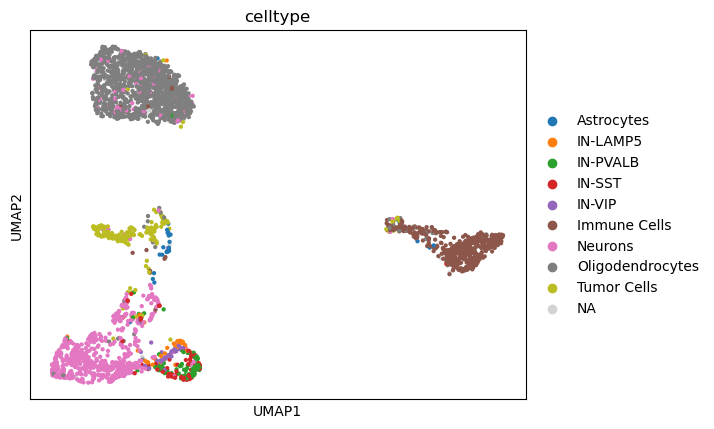

In [69]:
markers = ['celltype']
sc.pl.umap(gene_matrix, use_raw=False, color= markers , ncols=2)

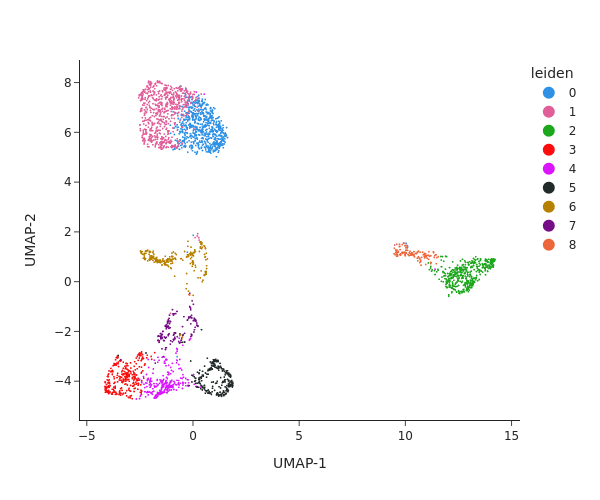

In [71]:
snap.pl.umap(data, color='leiden', interactive=False, height=500)

In [70]:
gene_matrix.obs['UMAP of ATAC in BTROH01-Perimarginal'] = gene_matrix.obs['celltype'] 

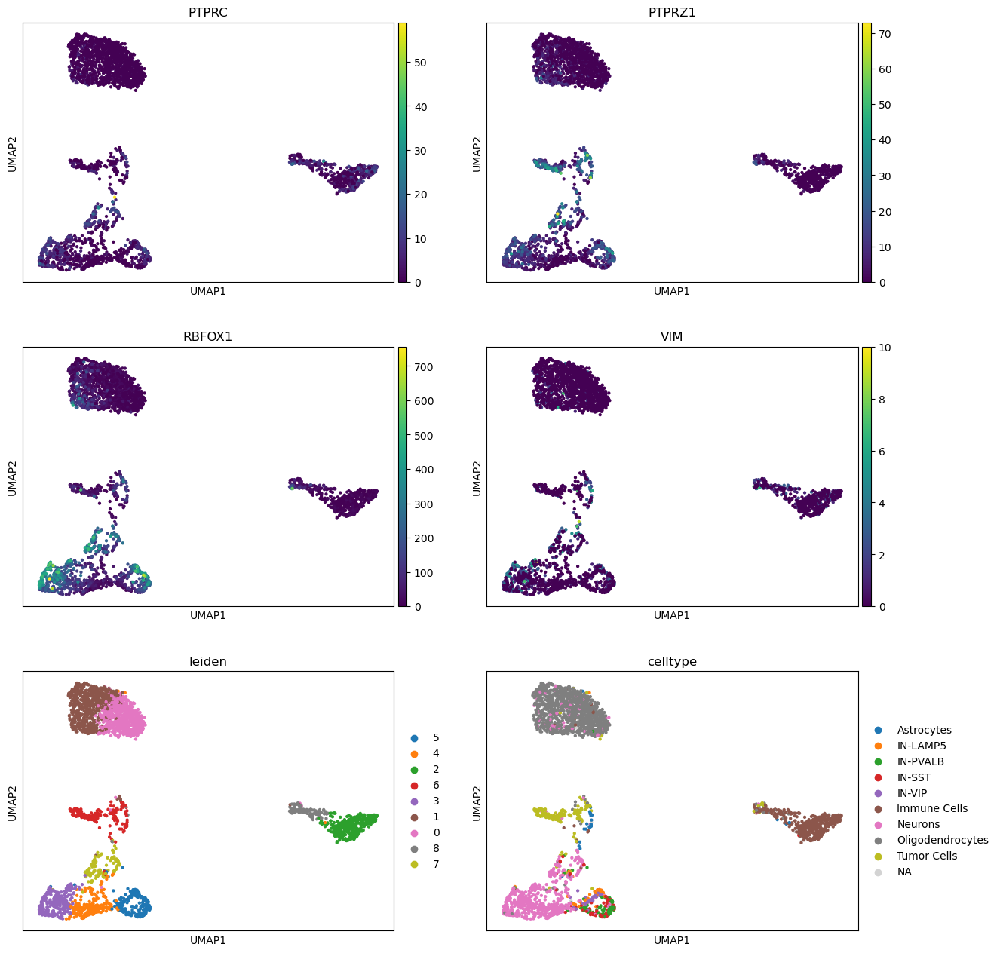

In [145]:
markers = ['PTPRC', 'PTPRZ1', 'RBFOX1','VIM', 'leiden','celltype']
sc.pl.umap(gene_matrix, use_raw=False, color= markers , ncols=2)

<Figure size 200x300 with 0 Axes>

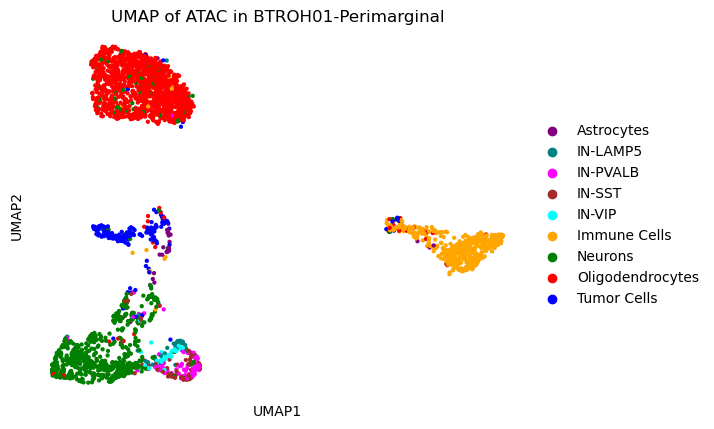

In [75]:
import os
import matplotlib.pyplot as plt
import scanpy as sc

# Assuming 'gene_matrix' is your AnnData object

# Define the markers and their corresponding colors
markers = ['UMAP of ATAC in BTROH01-Perimarginal']
color_map = {
    'Oligodendrocytes': 'red',
    'Neurons': 'green',
    'Immune Cells': 'orange',
    'Tumor Cells': 'blue',
    'Astrocytes': 'purple',
    'IN-LAMP5': 'teal',
    'IN-PVALB': 'magenta',
    'IN-SST': 'brown',
    'IN-VIP': 'cyan'
}

# Assign 'NA' cells based on 'UMAP of ATAC in BTROH01-Perimarginal'
na_cells = gene_matrix.obs['UMAP of ATAC in BTROH01-Perimarginal'].isna()

# Cluster-to-cell type mapping based on the Leiden clusters
cluster_to_celltype = {
    '0': 'Oligodendrocytes',
    '1': 'Oligodendrocytes',
    '6': 'Tumor Cells',
    '7': 'Neurons',
    '4': 'Neurons',
    '5': 'IN-PVALB',
    '3': 'Neurons',
    '2': 'Immune Cells',
    '8': 'Immune Cells'
}

# Loop through NA cells and assign cell types based on the Leiden clustering
for cluster, celltype in cluster_to_celltype.items():
    gene_matrix.obs.loc[na_cells & (gene_matrix.obs['leiden'] == cluster), 'UMAP of ATAC in BTROH01-Perimarginal'] = celltype

# Ensure the output directory exists
output_dir = 'figures'
os.makedirs(output_dir, exist_ok=True)

# Set figure size using matplotlib before plotting
plt.figure(figsize=(2, 3))

# Create a UMAP plot with specified colors
sc.pl.umap(
    gene_matrix,
    use_raw=False,
    color=markers,
    ncols=2,
    palette=color_map,
    show=False
)

# Remove the box around the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Save the figure
fig = plt.gcf()  # Capture current figure
save_path_png = os.path.join(output_dir, 'Peri_atac_annotated_plots.jpg')
save_path_pdf = os.path.join(output_dir, 'Peri_atac_annotated_plots.pdf')
fig.savefig(save_path_png, bbox_inches='tight')
fig.savefig(save_path_pdf, bbox_inches='tight')

# Show the plot
plt.show()


In [126]:
gene_matrix

AnnData object with n_obs × n_vars = 3123 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal'
    uns: 'UMAP of ATAC in BTROH01-Perimarginal_colors', 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

In [127]:
gene_matrix.write(f'{BASE_DIR}/BTROHT01_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [128]:
gene_matrix=sc.read(f'{BASE_DIR}/BTROHT01_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [129]:
gene_matrix

AnnData object with n_obs × n_vars = 3123 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal'
    uns: 'UMAP of ATAC in BTROH01-Perimarginal_colors', 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

In [157]:
atac

AnnData object with n_obs × n_vars = 3123 × 113700
    obs: 'n_genes_by_counts', 'total_counts', 'nucleosome_signal'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'atac', 'files'

## Normalization

In [83]:
atac= atac[list(set(gene_matrix.obs_names) & set(rna_perimarginal.obs_names)), :]
atac

View of AnnData object with n_obs × n_vars = 3004 × 113700
    obs: 'n_genes_by_counts', 'total_counts', 'nucleosome_signal'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'atac', 'files'

In [84]:
atac.layers["counts"] = atac.X

/tmp/ipykernel_2257645/1225148405.py:1: ImplicitModificationWarning:

Setting element `.layers['counts']` of view, initializing view as actual.



In [85]:
ac.pp.tfidf(atac, scale_factor=1e4)

In [86]:
sc.pp.normalize_per_cell(atac, counts_per_cell_after=1e4)
sc.pp.log1p(atac)

In [87]:
sc.pp.highly_variable_genes(atac, min_mean=0.05, max_mean=1.5, min_disp=.5)

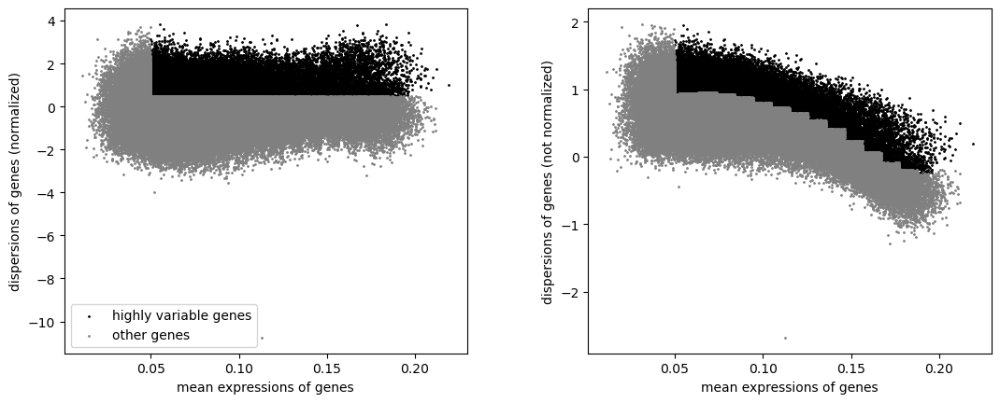

In [88]:
sc.pl.highly_variable_genes(atac)

In [89]:
np.sum(atac.var.highly_variable)

29132

In [90]:
atac.raw = atac

## LSI, gragh on LSI, PCA

In [96]:
ac.tl.lsi(atac)

In [97]:
atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
atac.varm["LSI"] = atac.varm["LSI"][:,1:]
atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:] #We find the first component is typically associated with number of peaks or counts per cell so it is reasonable to remove it

In [98]:
sc.pp.neighbors(atac, use_rep="X_lsi", n_neighbors=10, n_pcs=30)

In [99]:
sc.pp.scale(atac)
sc.tl.pca(atac)

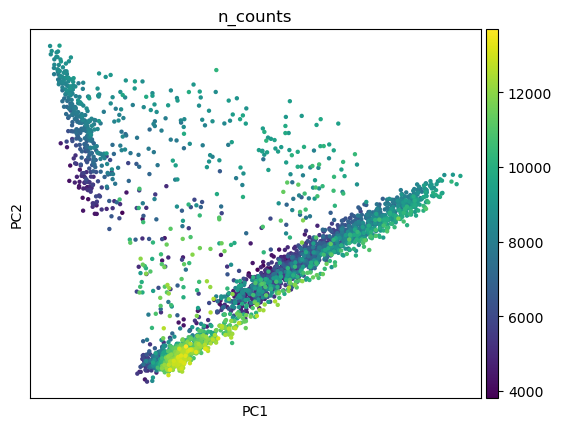

In [100]:
sc.pl.pca(atac, color= ["n_counts"])

In [101]:
sc.tl.umap(atac, min_dist=0.05)

In [102]:
atac.obs['celltype_from_gex']=rna_perimarginal.obs['celltype'].reindex(atac.obs_names)

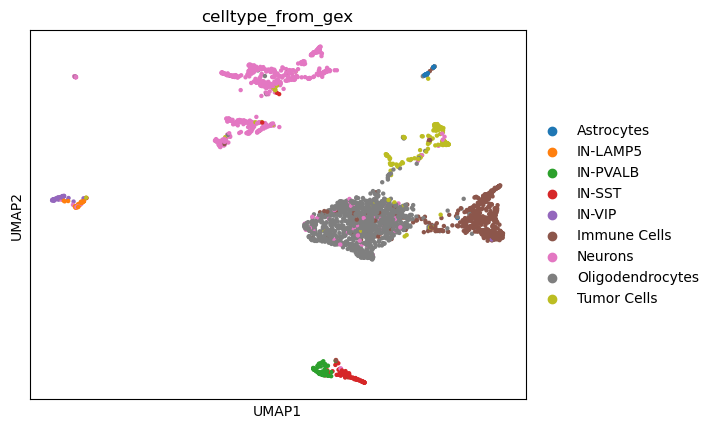

In [103]:
sc.pl.umap(atac, color=["celltype_from_gex"])

## Graph on PCA 

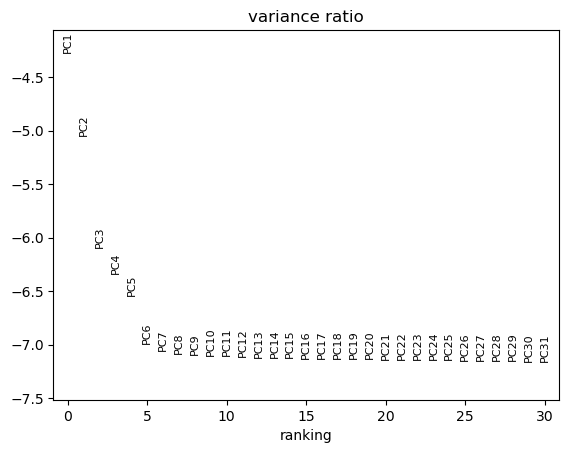

In [104]:
sc.pl.pca_variance_ratio(atac, log=True, )

In [105]:
sc.pp.neighbors(atac, n_neighbors=10, n_pcs=20)

In [106]:
sc.tl.leiden(atac, resolution=.6)

/tmp/ipykernel_2257645/4120330705.py:1: FutureWarning:

In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.



In [107]:
sc.tl.umap(atac, spread=1, min_dist=.1, random_state=20)

In [108]:
#atac.obs['celltype_from_atac']=gene_matrix.obs['celltype_final'].reindex(atac.obs_names)
#atac.obs['celltype_from_gex']=rna.obs['celltype_with_tumor'].reindex(atac.obs_names)

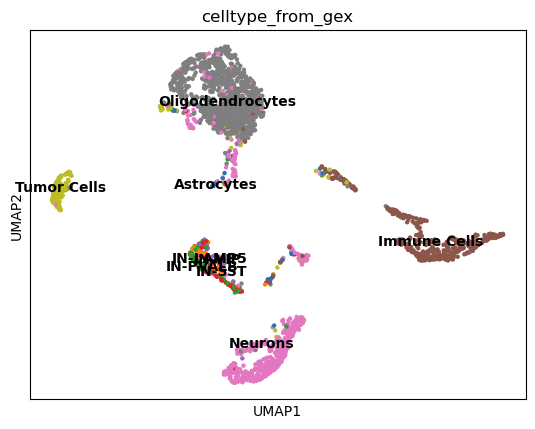

In [109]:
sc.pl.umap(atac, color=["celltype_from_gex"], legend_loc="on data")

In [111]:
atac.write(f'{BASE_DIR}/BTROHT01_8_peri_atac_ANNOTATED_FINAL.h5ad')

## For CONGAS 

### BARCODES

In [9]:
gene_matrix=sc.read(f'{BASE_DIR}/BTROHT01_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [10]:
gene_matrix

AnnData object with n_obs × n_vars = 3123 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal'
    uns: 'UMAP of ATAC in BTROH01-Perimarginal_colors', 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

In [11]:
gene_matrix.obs['celltype'].value_counts()

celltype
Oligodendrocytes    1220
Neurons              709
Immune Cells         538
Tumor Cells          227
IN-SST                96
IN-PVALB              88
IN-VIP                47
IN-LAMP5              45
Astrocytes            34
Name: count, dtype: int64

In [13]:
total_cells = gene_matrix.obs['UMAP of ATAC in BTROH01-Perimarginal'].value_counts().sum()
print(total_cells)


3123


In [14]:
write_dataset(pd.DataFrame(gene_matrix.obs['UMAP of ATAC in BTROH01-Perimarginal']),
               f'{BASE_DIR}/CONGAS/BTROHT01_peri_barcodes_all.tsv')

In [10]:
write_dataset(pd.DataFrame(gene_matrix.obs[gene_matrix.obs['leiden'].isin(['4'])]['leiden']),
                f'{BASE_DIR}/CONGAS/BTROHT01_peri_barcodes_tumors.tsv')


# Segment file 

In [15]:
segs=pd.read_csv(f'{BASE_DIR}/CONGAS/BTROHT01_T3.seg.txt', sep='\t')


In [16]:
segs

,ID,chrom,start,end,num.mark,seg.median.logR,copy.number,call,subclone.status,logR_Copy_Number,Corrected_Copy_Number,Corrected_Call
0,BTROHT01_T3,1,1000001,248000000,247,0.024344,2,NEUT,False,2.051394,2,NEUT
1,BTROHT01_T3,2,1000001,242000000,241,0.021441,2,NEUT,False,2.045714,2,NEUT
2,BTROHT01_T3,3,1000001,198000000,197,0.011203,2,NEUT,False,2.025768,2,NEUT
3,BTROHT01_T3,4,2000001,189000000,187,-0.018155,2,NEUT,False,1.969356,2,NEUT
4,BTROHT01_T3,5,1000001,181000000,180,-0.006821,2,NEUT,False,1.990998,2,NEUT
5,BTROHT01_T3,6,1000001,170000000,169,-0.012902,2,NEUT,False,1.979365,2,NEUT
6,BTROHT01_T3,7,1000001,159000000,158,0.431320,3,GAIN,False,2.972451,3,GAIN
7,BTROHT01_T3,8,1000001,145000000,144,0.004162,2,NEUT,False,2.012135,2,NEUT
8,BTROHT01_T3,9,1000001,138000000,137,-0.003340,2,NEUT,False,1.997680,2,NEUT
9,BTROHT01_T3,10,1000001,133000000,132,-0.656806,1,HETD,False,0.987819,1,HETD


In [17]:
segs=segs[['chrom', 'start', 'end', 'copy.number']]

In [18]:
segs=segs.rename(columns={'chrom':'chr',
                          'start':'from', 
                          'end':'to', 
                          'copy.number':'copies'})
segs

,chr,from,to,copies
0,1,1000001,248000000,2
1,2,1000001,242000000,2
2,3,1000001,198000000,2
3,4,2000001,189000000,2
4,5,1000001,181000000,2
5,6,1000001,170000000,2
6,7,1000001,159000000,3
7,8,1000001,145000000,2
8,9,1000001,138000000,2
9,10,1000001,133000000,1


In [19]:
segs['chr'] = 'chr' + segs['chr'].astype(str)
segs

,chr,from,to,copies
0,chr1,1000001,248000000,2
1,chr2,1000001,242000000,2
2,chr3,1000001,198000000,2
3,chr4,2000001,189000000,2
4,chr5,1000001,181000000,2
5,chr6,1000001,170000000,2
6,chr7,1000001,159000000,3
7,chr8,1000001,145000000,2
8,chr9,1000001,138000000,2
9,chr10,1000001,133000000,1


In [20]:
segs=segs.loc[[6, 9, 13, 21]]

In [21]:
segs

,chr,from,to,copies
6,chr7,1000001,159000000,3
9,chr10,1000001,133000000,1
13,chr14,20000001,105000000,1
21,chr22,19000001,49000000,1


In [22]:
write_dataset(segs,  f'{BASE_DIR}/CONGAS/BTROHT01_peri_segs_chr7_10_14_22_tumors.tsv')

In [20]:
clusters_from_congas=pd.read_csv(f'{BASE_DIR}/CONGAS/BTROHT01_peri_CONGAS_Clusters.csv', sep=',')
clusters_from_congas

,cell,cluster,modality,multiome_barcode
0,AAACAGCCAATGCCCG-1-ATAC,C2,ATAC,AAACAGCCAATGCCCG-1
1,AAACAGCCATAAGGAC-1-ATAC,C2,ATAC,AAACAGCCATAAGGAC-1
2,AAACATGCAGAACCGA-1-ATAC,C2,ATAC,AAACATGCAGAACCGA-1
3,AAACATGCAGCATTAT-1-ATAC,C4,ATAC,AAACATGCAGCATTAT-1
4,AAACATGCAGGATGGC-1-ATAC,C2,ATAC,AAACATGCAGGATGGC-1
...,...,...,...,...
6241,TTTGTGTTCCGTCCAT-1-RNA,C4,RNA,TTTGTGTTCCGTCCAT-1
6242,TTTGTGTTCGTTCACC-1-RNA,C4,RNA,TTTGTGTTCGTTCACC-1
6243,TTTGTTGGTAACGGGA-1-RNA,C4,RNA,TTTGTTGGTAACGGGA-1
6244,TTTGTTGGTTAACGGC-1-RNA,C4,RNA,TTTGTTGGTTAACGGC-1


In [21]:
clusters_from_congas=clusters_from_congas[clusters_from_congas['modality']=='ATAC']
clusters_from_congas=clusters_from_congas.set_index('multiome_barcode')
clusters_from_congas

,cell,cluster,modality
multiome_barcode,,,
AAACAGCCAATGCCCG-1,AAACAGCCAATGCCCG-1-ATAC,C2,ATAC
AAACAGCCATAAGGAC-1,AAACAGCCATAAGGAC-1-ATAC,C2,ATAC
AAACATGCAGAACCGA-1,AAACATGCAGAACCGA-1-ATAC,C2,ATAC
AAACATGCAGCATTAT-1,AAACATGCAGCATTAT-1-ATAC,C4,ATAC
AAACATGCAGGATGGC-1,AAACATGCAGGATGGC-1-ATAC,C2,ATAC
...,...,...,...
TTTGTGTTCCGTCCAT-1,TTTGTGTTCCGTCCAT-1-ATAC,C4,ATAC
TTTGTGTTCGTTCACC-1,TTTGTGTTCGTTCACC-1-ATAC,C4,ATAC
TTTGTTGGTAACGGGA-1,TTTGTTGGTAACGGGA-1-ATAC,C4,ATAC


In [22]:
gene_matrix.obs['congas_cluster']=clusters_from_congas.reindex(gene_matrix.obs_names)['cluster']

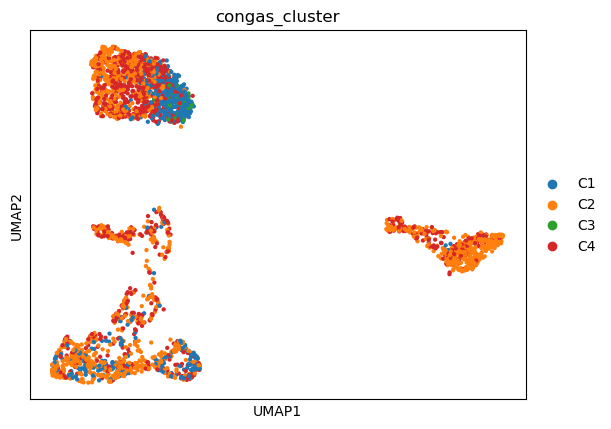

In [23]:
save_path='_ATAC_clusters_congas_all.pdf'
sc.pl.umap(gene_matrix, color=["congas_cluster"] , ncols=2, save=save_path)

<Figure size 4000x1800 with 0 Axes>

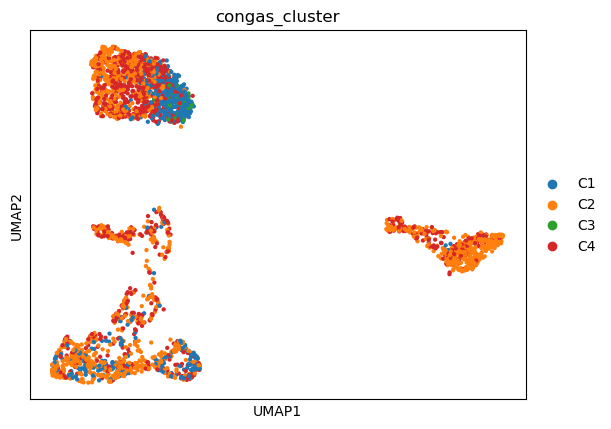

In [27]:
import matplotlib.pyplot as plt

# Define the save path
save_path = '_ATAC_clusters_congas_all.pdf'

# Adjust the figure size using matplotlib's plt.figure()
plt.figure(figsize=(40, 18))  # Adjust size as needed

# Create and save the UMAP plot
sc.pl.umap(gene_matrix, color=["congas_cluster"], ncols=2, save=save_path)

# Close the plot to avoid overlaps in future plots
plt.close()
